In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

#!python write_filelist.py

Mounted at /content/gdrive


In [ ]:
!pip install easyfsl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 42 kB 905 kB/s 


In [ ]:
import os
import random
from tqdm import tqdm
import numpy as np
import torch, torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data.dataset import Dataset   
from torchvision.datasets import CIFAR100,Omniglot
from torchvision.models import resnet18
torch.backends.cudnn.benchmark=True

from torch.utils.data import DataLoader
from easyfsl.samplers import TaskSampler
from easyfsl.utils import plot_images, sliding_average

In [ ]:
num_clients = 2
num_selected = 2
num_rounds = 20
epochs = 5
batch_size = 32

SN_WAY = int(input("\nEnter number of classes for support and query sets: "))  # Number of classes in a task
SN_SHOT = int(input("\nEnter number of samples in each class for support set: "))  # Number of images per class in the support set
SN_QUERY = int(input("\nEnter number of samples in each class for query set:")) # Number of images per class in the query set


Enter number of classes for support and query sets: 5

Enter number of samples in each class for support set: 5

Enter number of samples in each class for query set:5


In [ ]:
print("\n Arranging train and test sets for CIFAR100... ")
image_size = 28


train_set = CIFAR100(
    root="./data",
    train=True,
    transform=transforms.Compose(
        [
            transforms.Grayscale(num_output_channels=3),
            transforms.RandomResizedCrop(image_size),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
        ]
    ),
    download=True,
)

test_set = CIFAR100(
    root="./data",
    train=False,
    transform=transforms.Compose(
        [
            # Omniglot images have 1 channel, but our model will expect 3-channel images
            transforms.Grayscale(num_output_channels=3),
            transforms.Resize([int(image_size * 1.15), int(image_size * 1.15)]),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
        ]
    ),
    download=True,
)


 Arranging train and test sets for CIFAR100... 


  0%|          | 0/169001437 [00:00<?, ?it/s]

Extracting ./data/cifar-100-python.tar.gz to ./data
Files already downloaded and verified


In [ ]:
len(train_set.classes)

100

In [ ]:
len(test_set.classes)

100

In [ ]:

import torch
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset
from sklearn.model_selection import train_test_split
from torchvision.transforms import Compose, ToTensor, Resize
from torch.utils.data import DataLoader

def train_val_dataset(dataset, val_split=0.80):
    train1, val1 = train_test_split(list(range(len(dataset))), test_size=val_split)

    datasets = {}
    datasets['train1'] = Subset(dataset, train1)
    datasets['val1'] = Subset(dataset, val1)
    return datasets

print(len(train_set))
datasets = train_val_dataset(train_set)

val_set=datasets['train1']
train_set1=datasets['val1']

print(len(val_set))
print(len(train_set1))







50000
10000
40000


In [ ]:
def train_val_dataset2(dataset, val_split=0.75):
    v1, v2 = train_test_split(list(range(len(dataset))), test_size=val_split)

    datasets = {}
    datasets[0] = Subset(dataset, v1)
    datasets[1] = Subset(dataset, v2)
    return datasets

#*****************************
print("\nSecond division")
print(len(train_set1))
datasets = train_val_dataset2(train_set1)

val_set1=datasets[0]
train_set2=datasets[1]

print(len(val_set1))
print(len(train_set2))          #get temp2 for client 1



Second division
40000
10000
30000


In [ ]:
def train_val_dataset3(dataset, val_split=0.666666):
    v1, v2 = train_test_split(list(range(len(dataset))), test_size=val_split)

    datasets = {}
    datasets[0] = Subset(dataset, v1)
    datasets[1] = Subset(dataset, v2)
    return datasets

#*****************************
print("\nSecond division")
print(len(train_set2))
datasets = train_val_dataset3(train_set2)

val_set2=datasets[0]
train_set3=datasets[1]

print(len(val_set2))
print(len(train_set3))          #get temp2 for client 1



Second division
30000
10000
20000


In [ ]:
class PrototypicalNetworks(nn.Module):
    def __init__(self, backbone: nn.Module):
        super(PrototypicalNetworks, self).__init__()
        self.backbone = backbone

    def forward(
        self,
        support_images: torch.Tensor,
        support_labels: torch.Tensor,
        query_images: torch.Tensor,
    ) -> torch.Tensor:
        """
        Predict query labels using labeled support images.
        """
        # Extract the features of support and query images
        z_support = self.backbone.forward(support_images)
        z_query = self.backbone.forward(query_images)

        # Infer the number of different classes from the labels of the support set
        n_way = len(torch.unique(support_labels))
        # Prototype i is the mean of all instances of features corresponding to labels == i
        z_proto = torch.cat(
            [
                z_support[torch.nonzero(support_labels == label)].mean(0)
                for label in range(n_way)
            ]
        )

        # Compute the euclidean distance from queries to prototypes
        dists = torch.cdist(z_query, z_proto)

        # And here is the super complicated operation to transform those distances into classification scores!
        scores = -dists
        return scores


convolutional_network = resnet18(pretrained=False)
convolutional_network.fc = nn.Flatten()
print("Prototypical Meta-Learning Model using Resnet18 Ready!")

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Prototypical Meta-Learning Model using Resnet18 Ready!


## Data Sampling into support set and query set

In [ ]:
def server_basedata():
    N_TRAINING_EPISODES = 400
    N_VALIDATION_TASKS = 100

    train_set3.get_labels = lambda: [instance[1] for instance in train_set3]
    train_sampler = TaskSampler(
        train_set3, n_way=SN_WAY, n_shot=SN_SHOT, n_query=SN_QUERY, n_tasks=N_TRAINING_EPISODES
    )
    train_loader = DataLoader(
        train_set3,
        batch_sampler=train_sampler,
        num_workers=12, 
        pin_memory=True,
        collate_fn=train_sampler.episodic_collate_fn,
    )

    print("\nLarge training data of Fashion_MNIST Server side Global Model is ready!")

    return train_loader

In [ ]:
def client1_data():      
  C1N_WAY = SN_WAY
  C1N_SHOT = SN_SHOT
  C1N_QUERY = SN_QUERY
  C1N_EVALUATION_TASKS = 100

  print("\nNumber of evaluation tasks taken 100.")

  # The sampler needs a dataset with a "get_labels" method. Check the code if you have any doubt!
  val_set.get_labels = lambda: [
      instance[1] for instance in val_set
  ]
  val_sampler1 = TaskSampler(
      val_set, n_way=C1N_WAY, n_shot=C1N_SHOT, n_query=C1N_QUERY, n_tasks=C1N_EVALUATION_TASKS
  )
  
  test_loader1 = DataLoader(
      val_set,
      batch_sampler=val_sampler1,
      num_workers=12,
      pin_memory=True,
      collate_fn=val_sampler1.episodic_collate_fn,
  )

  print("Test Dataset with given support and query sets for client 1 ready!")


  with tqdm(enumerate(test_loader1), total=len(test_loader1)) as tqdm_train:
          for episode_index, (
            support_images,
            support_labels,
            query_images,
            query_labels,
            class_ids,
      ) in tqdm_train:
              if episode_index==5:
                      s1i,q1i=support_images,query_images
                      print("\nEpsiode index=",episode_index)
                      s1_images,s1_labels,q1_images, q1_labels = support_images.cuda(),support_labels.cuda(),query_images.cuda(), query_labels.cuda()


  print("\n New Test Sample for Client-1 private data ready!")
  plot_images(s1i, "support images", images_per_row=C1N_WAY)
  plot_images(q1i, "query images", images_per_row=C1N_SHOT)
  return s1_images,s1_labels,q1_images, q1_labels,class_ids



In [ ]:
def client2_data():      
  C1N_WAY = SN_WAY
  C1N_SHOT = SN_SHOT
  C1N_QUERY = SN_QUERY
  C1N_EVALUATION_TASKS = 100

  print("\nNumber of evaluation tasks taken 100.")

  # The sampler needs a dataset with a "get_labels" method. Check the code if you have any doubt!
  val_set1.get_labels = lambda: [
      instance[1] for instance in val_set1
  ]
  val_sampler2 = TaskSampler(
      val_set1, n_way=C1N_WAY, n_shot=C1N_SHOT, n_query=C1N_QUERY, n_tasks=C1N_EVALUATION_TASKS
  )
  
  test_loader2 = DataLoader(
      val_set1,
      batch_sampler=val_sampler2,
      num_workers=12,
      pin_memory=True,
      collate_fn=val_sampler2.episodic_collate_fn,
  )

  print("Test Dataset with given support and query sets for client 1 ready!")


  with tqdm(enumerate(test_loader2), total=len(test_loader2)) as tqdm_train:
          for episode_index, (
            support_images,
            support_labels,
            query_images,
            query_labels,
            class_ids,
      ) in tqdm_train:
              if episode_index==5:
                      s1i,q1i=support_images,query_images
                      print("\nEpsiode index=",episode_index)
                      s1_images,s1_labels,q1_images, q1_labels = support_images.cuda(),support_labels.cuda(),query_images.cuda(), query_labels.cuda()


  print("\n New Test Sample for Client-2 private data ready!")
  plot_images(s1i, "support images", images_per_row=C1N_WAY)
  plot_images(q1i, "query images", images_per_row=C1N_SHOT)
  return s1_images,s1_labels,q1_images, q1_labels,class_ids



In [ ]:
def client3_data():      
  C1N_WAY = SN_WAY
  C1N_SHOT = SN_SHOT
  C1N_QUERY = SN_QUERY
  C1N_EVALUATION_TASKS = 100

  print("\nNumber of evaluation tasks taken 100.")

  # The sampler needs a dataset with a "get_labels" method. Check the code if you have any doubt!
  val_set2.get_labels = lambda: [
      instance[1] for instance in val_set2
  ]
  val_sampler3 = TaskSampler(
      val_set2, n_way=C1N_WAY, n_shot=C1N_SHOT, n_query=C1N_QUERY, n_tasks=C1N_EVALUATION_TASKS
  )
  
  test_loader3 = DataLoader(
      val_set2,
      batch_sampler=val_sampler3,
      num_workers=12,
      pin_memory=True,
      collate_fn=val_sampler3.episodic_collate_fn,
  )

  print("Test Dataset with given support and query sets for client 1 ready!")


  with tqdm(enumerate(test_loader3), total=len(test_loader3)) as tqdm_train:
          for episode_index, (
            support_images,
            support_labels,
            query_images,
            query_labels,
            class_ids,
      ) in tqdm_train:
              if episode_index==5:
                      s1i,q1i=support_images,query_images
                      print("\nEpsiode index=",episode_index)
                      s1_images,s1_labels,q1_images, q1_labels = support_images.cuda(),support_labels.cuda(),query_images.cuda(), query_labels.cuda()


  print("\n New Test Sample for Client-3 private data ready!")
  plot_images(s1i, "support images", images_per_row=C1N_WAY)
  plot_images(q1i, "query images", images_per_row=C1N_SHOT)
  return s1_images,s1_labels,q1_images, q1_labels,class_ids



In [ ]:
def server_testdata():
    SN_WAY = 5
    SN_SHOT = 5
    SN_QUERY = 10
    #SN_WAY = int(input("\n: Enter number of classes for support and query sets: "))  # Number of classes in a task
    #SN_SHOT = int(input("\n:Enter number of samples in each class for support set: "))  # Number of images per class in the support set
    #SN_QUERY = int(input("\nEnter number of samples in each class for query set:")) # Number of images per class in the query set
    SN_EVALUATION_TASKS = 100

    print("\nNumber of evaluation tasks taken 100.")

    # The sampler needs a dataset with a "get_labels" method. Check the code if you have any doubt!
    test_set.get_labels = lambda: [
        instance[1] for instance in test_set
    ]
    test_sampler = TaskSampler(
        test_set, n_way=SN_WAY, n_shot=SN_SHOT, n_query=SN_QUERY, n_tasks=SN_EVALUATION_TASKS
    )
    
    test_loader = DataLoader(
        test_set,
        batch_sampler=test_sampler,
        num_workers=12,
        pin_memory=True,
        collate_fn=test_sampler.episodic_collate_fn,
    )

    print("\nTest Dataset with given support and query sets for server ready!")



    with tqdm(enumerate(test_loader), total=len(test_loader)) as tqdm_train: #server new data 
            for episode_index, (
              support_images,
              support_labels,
              query_images,
              query_labels,
              class_ids,
        ) in tqdm_train:
                if episode_index==6:
                        si,qi=support_images,query_images
                        print("\nEpsiode index=",episode_index)
                        s_images,s_labels,q_images, q_labels = support_images.cuda(),support_labels.cuda(),query_images.cuda(), query_labels.cuda()

    print("\n New test sample for Server side testing ready! ")
    plot_images(si, "support images", images_per_row=SN_SHOT)
    plot_images(qi, "query images", images_per_row=SN_QUERY)
    return s_images,s_labels,q_images, q_labels,class_ids

## Training data for server-global model

In [ ]:
train_accu=[]
train_losses=[]
def Server_BaseTrain(global_model, train_loader):
    """
    This function updates/trains client model on client data
    """
    global_model.train()
    optimizer=optim.SGD(global_model.parameters(),lr=0.1)
    loss_fn=nn.CrossEntropyLoss()
    running_loss=0
    correct=0
    total=0
    with tqdm(enumerate(train_loader), total=len(train_loader)) as tqdm_train:
         for episode_index, (
          support_images,
          support_labels,
          query_images,
          query_labels,
           class_ids,
    ) in tqdm_train:
            print("\nEpsiode index=",episode_index)
            support_images,support_labels,query_images, query_labels = support_images.cuda(),support_labels.cuda(),query_images.cuda(), query_labels.cuda()
            optimizer.zero_grad()
            outputs = global_model(support_images, support_labels, query_images)
            loss=loss_fn(outputs,query_labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
    
            _, predicted = outputs.max(1)
            total += query_labels.size(0)
            correct += predicted.eq(query_labels).sum().item()
      
            print(loss.item())
           

            print("\nGround Truth / Predicted")
            for i in range(len(query_labels)):
                  print(f"{train_set.classes[class_ids[query_labels[i]]]} / {train_set.classes[class_ids[predicted[i]]]}")
            
    

    train_loss=running_loss/len(train_loader)
    accu=100.*correct/total

    print('\nTrain Loss: %.3f | Accuracy: %.3f'%(train_loss,accu))

    train_accu.append(accu)
    train_losses.append(train_loss)
    return accu
    
   


    

# Federated learning Client and Server updating methods

In [ ]:
train_accu=[]
train_losses=[]
def client_update(client_model, optimizer, support_images,support_labels,query_images, query_labels,class_ids):
    """
    This function updates/trains client model on client data
    """
    client_model.train()
    loss_fn=nn.CrossEntropyLoss()
    running_loss=0
    correct=0
    total=0

    support_images,support_labels,query_images, query_labels = support_images.cuda(),support_labels.cuda(),query_images.cuda(), query_labels.cuda()
    optimizer.zero_grad()
    outputs = client_model(support_images, support_labels, query_images)
    loss=loss_fn(outputs,query_labels)
    loss.backward()
    optimizer.step()

    running_loss += loss.item()
    _, predicted = outputs.max(1)
    total += query_labels.size(0)
    correct += predicted.eq(query_labels).sum().item()
      
    train_loss=running_loss
    accu=100.*correct/total
    
    train_accu.append(accu)
    train_losses.append(train_loss)

    print("\nGround Truth / Predicted")
    for i in range(len(query_labels)):
        print(f"{train_set.classes[class_ids[query_labels[i]]]} / {train_set.classes[class_ids[predicted[i]]]}")
    return  client_model.state_dict(),train_loss, accu


    

In [ ]:
def difference_models_norm_2(model_1, model_2):
    """Return the norm 2 difference between the two model parameters
    """
    
    tensor_1=list(model_1.parameters())
    tensor_2=list(model_2.parameters())
    
    norm=sum([torch.sum((tensor_1[i]-tensor_2[i])**2) 
        for i in range(len(tensor_1))])
    
    return norm

In [ ]:
mu=1.5

In [ ]:
from copy import deepcopy
def prox_update(global_model,client_model, optimizer, support_images,support_labels,query_images, query_labels,class_ids):
  client_model.train()
  loss_fn=nn.CrossEntropyLoss()
  running_loss=0
  correct=0
  total=0
   
  
  support_images,support_labels,query_images, query_labels = support_images.cuda(),support_labels.cuda(),query_images.cuda(), query_labels.cuda()
  optimizer.zero_grad()
  outputs = client_model(support_images, support_labels, query_images)
  loss=loss_fn(outputs,query_labels)
  loss+=mu/2*difference_models_norm_2(client_model,global_model)
  loss.backward()
  optimizer.step()

  running_loss += loss.item()
  _, predicted = outputs.max(1)
  total += query_labels.size(0)
  correct += predicted.eq(query_labels).sum().item()
    
  train_loss=running_loss
  accu=100.*correct/total
  
  train_accu.append(accu)
  train_losses.append(train_loss)

  print("\nGround Truth / Predicted")
  for i in range(len(query_labels)):
      print(f"{train_set.classes[class_ids[query_labels[i]]]} / {train_set.classes[class_ids[predicted[i]]]}")
  return  client_model.state_dict(),train_loss, accu


  


In [ ]:
def server_aggregate(global_model, client_models):
      global_dict = global_model.state_dict()
      for k in global_dict.keys():
          global_dict[k] = torch.stack([client_models[i].state_dict()[k].float() for i in range(len(client_models))], 0).mean(0)
      global_model.load_state_dict(global_dict)
      for model in client_models:
          model.load_state_dict(global_model.state_dict())
      return global_model

In [ ]:
eval_losses=[]
eval_accu=[]

def test(global_model,support_images,support_labels,query_images, query_labels,class_ids):
  global_model.eval()
  loss_fn=nn.CrossEntropyLoss()
  running_loss=0
  correct=0
  total=0

  with torch.no_grad():
    train_accu=[]
    train_losses=[]
    support_images,support_labels,query_images, query_labels = support_images.cuda(),support_labels.cuda(),query_images.cuda(), query_labels.cuda()
    outputs = global_model(support_images, support_labels, query_images)
    loss=loss_fn(outputs,query_labels)
    running_loss+=loss.item()
    _, predicted = outputs.max(1)
    total += query_labels.size(0)
    correct += predicted.eq(query_labels).sum().item()
  
  test_loss=running_loss
  accu=100.*correct/total

  eval_losses.append(test_loss)
  eval_accu.append(accu)

  print("\nGround Truth / Predicted")
  for i in range(len(query_labels)):
      print(f"{test_set.classes[class_ids[query_labels[i]]]} / {test_set.classes[class_ids[predicted[i]]]}")

  return test_loss,accu 
  

#Client updates

# Performing Federated Few-shot learning

In [ ]:
import copy
import time

In [ ]:
global_model = PrototypicalNetworks(convolutional_network).cuda()

#get Server whole base train data

train_loader= server_basedata()
print("Training FMINST base data on Server side...")
accu=Server_BaseTrain(global_model,train_loader)

#Server_BaseTrain2(global_model,Otrain_loader)

w_glob = global_model.state_dict()





Large training data of Fashion_MNIST Server side Global Model is ready!
Training FMINST base data on Server side...


  0%|          | 0/400 [00:00<?, ?it/s]


Epsiode index= 0


  1%|          | 4/400 [00:08<10:21,  1.57s/it]

2.069378137588501

Ground Truth / Predicted
lobster / turtle
lobster / turtle
lobster / turtle
lobster / turtle
lobster / turtle
bee / telephone
bee / turtle
bee / pickup_truck
bee / bee
bee / telephone
telephone / turtle
telephone / turtle
telephone / bee
telephone / lobster
telephone / turtle
pickup_truck / pickup_truck
pickup_truck / lobster
pickup_truck / pickup_truck
pickup_truck / telephone
pickup_truck / telephone
turtle / turtle
turtle / telephone
turtle / turtle
turtle / turtle
turtle / pickup_truck

Epsiode index= 1
1.9348526000976562

Ground Truth / Predicted
willow_tree / bee
willow_tree / willow_tree
willow_tree / seal
willow_tree / willow_tree
willow_tree / willow_tree
seal / clock
seal / bee
seal / bear
seal / willow_tree
seal / willow_tree
clock / bee
clock / bear
clock / clock
clock / clock
clock / willow_tree
bear / bee
bear / bee
bear / bear
bear / willow_tree
bear / bee
bee / willow_tree
bee / willow_tree
bee / seal
bee / bear
bee / clock

Epsiode index= 2
3.3272182

  2%|▎         | 10/400 [00:08<02:52,  2.26it/s]

2.7436282634735107

Ground Truth / Predicted
bicycle / dolphin
bicycle / beetle
bicycle / poppy
bicycle / bicycle
bicycle / bicycle
poppy / dolphin
poppy / poppy
poppy / poppy
poppy / dolphin
poppy / poppy
bed / bicycle
bed / poppy
bed / beetle
bed / poppy
bed / dolphin
dolphin / poppy
dolphin / poppy
dolphin / dolphin
dolphin / dolphin
dolphin / beetle
beetle / bicycle
beetle / dolphin
beetle / poppy
beetle / beetle
beetle / bicycle

Epsiode index= 6
3.4718239307403564

Ground Truth / Predicted
hamster / cup
hamster / cup
hamster / telephone
hamster / cup
hamster / wolf
lobster / wolf
lobster / lobster
lobster / lobster
lobster / lobster
lobster / lobster
wolf / hamster
wolf / telephone
wolf / telephone
wolf / telephone
wolf / lobster
telephone / lobster
telephone / telephone
telephone / cup
telephone / telephone
telephone / wolf
cup / telephone
cup / hamster
cup / telephone
cup / lobster
cup / telephone

Epsiode index= 7
3.1859521865844727

Ground Truth / Predicted
clock / poppy
cloc

  3%|▎         | 13/400 [00:08<01:51,  3.46it/s]

4.184058666229248

Ground Truth / Predicted
can / dinosaur
can / squirrel
can / squirrel
can / dinosaur
can / apple
dinosaur / apple
dinosaur / squirrel
dinosaur / can
dinosaur / apple
dinosaur / squirrel
apple / dinosaur
apple / dinosaur
apple / wolf
apple / wolf
apple / wolf
squirrel / wolf
squirrel / dinosaur
squirrel / apple
squirrel / apple
squirrel / wolf
wolf / wolf
wolf / wolf
wolf / squirrel
wolf / wolf
wolf / squirrel

Epsiode index= 11
3.4348371028900146

Ground Truth / Predicted
bottle / bottle
bottle / clock
bottle / baby
bottle / mushroom
bottle / clock
baby / mushroom
baby / baby
baby / whale
baby / mushroom
baby / mushroom
mushroom / bottle
mushroom / bottle
mushroom / clock
mushroom / bottle
mushroom / mushroom
clock / clock
clock / clock
clock / baby
clock / bottle
clock / whale
whale / whale
whale / baby
whale / baby
whale / baby
whale / whale

Epsiode index= 12
6.569305896759033

Ground Truth / Predicted
sunflower / bear
sunflower / bottle
sunflower / squirrel
sunfl

  5%|▍         | 19/400 [00:08<00:56,  6.76it/s]


butterfly / seal
butterfly / shrew
butterfly / shrew
seal / bottle
seal / seal
seal / seal
seal / seal
seal / shrew
bottle / bottle
bottle / seal
bottle / bottle
bottle / butterfly
bottle / shrew
shrew / shrew
shrew / shrew
shrew / bridge
shrew / bridge
shrew / shrew
bridge / bridge
bridge / shrew
bridge / butterfly
bridge / shrew
bridge / shrew

Epsiode index= 16
2.36470103263855

Ground Truth / Predicted
mushroom / cup
mushroom / oak_tree
mushroom / mushroom
mushroom / mushroom
mushroom / castle
cup / oak_tree
cup / streetcar
cup / mushroom
cup / mushroom
cup / oak_tree
streetcar / castle
streetcar / castle
streetcar / cup
streetcar / oak_tree
streetcar / castle
castle / oak_tree
castle / oak_tree
castle / cup
castle / cup
castle / streetcar
oak_tree / castle
oak_tree / streetcar
oak_tree / oak_tree
oak_tree / oak_tree
oak_tree / oak_tree

Epsiode index= 17
5.056007385253906

Ground Truth / Predicted
tractor / butterfly
tractor / butterfly
tractor / tractor
tractor / sunflower
tract

  6%|▋         | 25/400 [00:09<00:34, 10.97it/s]

3.893315315246582

Ground Truth / Predicted
apple / raccoon
apple / apple
apple / poppy
apple / raccoon
apple / apple
raccoon / raccoon
raccoon / poppy
raccoon / poppy
raccoon / lamp
raccoon / raccoon
lamp / poppy
lamp / pear
lamp / pear
lamp / pear
lamp / poppy
poppy / poppy
poppy / lamp
poppy / poppy
poppy / raccoon
poppy / poppy
pear / lamp
pear / poppy
pear / pear
pear / lamp
pear / poppy

Epsiode index= 21
3.4923906326293945

Ground Truth / Predicted
dinosaur / squirrel
dinosaur / pickup_truck
dinosaur / pickup_truck
dinosaur / pickup_truck
dinosaur / squirrel
squirrel / squirrel
squirrel / flatfish
squirrel / dinosaur
squirrel / squirrel
squirrel / mushroom
pickup_truck / mushroom
pickup_truck / pickup_truck
pickup_truck / dinosaur
pickup_truck / dinosaur
pickup_truck / pickup_truck
mushroom / squirrel
mushroom / squirrel
mushroom / pickup_truck
mushroom / flatfish
mushroom / dinosaur
flatfish / mushroom
flatfish / flatfish
flatfish / squirrel
flatfish / mushroom
flatfish / squir

  7%|▋         | 28/400 [00:09<00:28, 13.10it/s]

2.354646682739258

Ground Truth / Predicted
turtle / turtle
turtle / turtle
turtle / turtle
turtle / plate
turtle / turtle
plate / bridge
plate / streetcar
plate / streetcar
plate / streetcar
plate / bridge
lizard / bridge
lizard / lizard
lizard / streetcar
lizard / streetcar
lizard / turtle
streetcar / lizard
streetcar / turtle
streetcar / turtle
streetcar / lizard
streetcar / turtle
bridge / turtle
bridge / lizard
bridge / streetcar
bridge / turtle
bridge / plate

Epsiode index= 26
1.8567204475402832

Ground Truth / Predicted
cockroach / kangaroo
cockroach / bear
cockroach / cockroach
cockroach / cockroach
cockroach / cockroach
bear / bear
bear / bear
bear / spider
bear / spider
bear / cockroach
spider / spider
spider / ray
spider / kangaroo
spider / ray
spider / bear
kangaroo / kangaroo
kangaroo / spider
kangaroo / kangaroo
kangaroo / kangaroo
kangaroo / kangaroo
ray / ray
ray / cockroach
ray / bear
ray / kangaroo
ray / kangaroo

Epsiode index= 27
4.428152561187744

Ground Truth / P

  8%|▊         | 34/400 [00:09<00:21, 16.96it/s]

2.239495038986206

Ground Truth / Predicted
plate / cattle
plate / lizard
plate / dinosaur
plate / dinosaur
plate / plate
dinosaur / sweet_pepper
dinosaur / plate
dinosaur / dinosaur
dinosaur / dinosaur
dinosaur / sweet_pepper
sweet_pepper / sweet_pepper
sweet_pepper / lizard
sweet_pepper / plate
sweet_pepper / lizard
sweet_pepper / cattle
lizard / sweet_pepper
lizard / lizard
lizard / lizard
lizard / cattle
lizard / cattle
cattle / lizard
cattle / lizard
cattle / cattle
cattle / lizard
cattle / cattle

Epsiode index= 31
2.009915351867676

Ground Truth / Predicted
mountain / mountain
mountain / orchid
mountain / castle
mountain / orchid
mountain / mountain
orchid / orchid
orchid / mountain
orchid / orchid
orchid / mountain
orchid / orchid
bottle / mountain
bottle / wolf
bottle / bottle
bottle / bottle
bottle / castle
wolf / bottle
wolf / wolf
wolf / orchid
wolf / orchid
wolf / orchid
castle / bottle
castle / castle
castle / castle
castle / mountain
castle / wolf

Epsiode index= 32
2.71

 10%|█         | 40/400 [00:09<00:18, 18.95it/s]

2.0769166946411133

Ground Truth / Predicted
bottle / seal
bottle / seal
bottle / dinosaur
bottle / bottle
bottle / dinosaur
lamp / hamster
lamp / hamster
lamp / hamster
lamp / lamp
lamp / hamster
dinosaur / lamp
dinosaur / dinosaur
dinosaur / seal
dinosaur / bottle
dinosaur / dinosaur
hamster / lamp
hamster / bottle
hamster / seal
hamster / bottle
hamster / seal
seal / dinosaur
seal / bottle
seal / hamster
seal / seal
seal / bottle

Epsiode index= 36
2.560425043106079

Ground Truth / Predicted
crocodile / tiger
crocodile / tiger
crocodile / seal
crocodile / leopard
crocodile / tiger
tiger / bowl
tiger / leopard
tiger / crocodile
tiger / tiger
tiger / crocodile
seal / leopard
seal / seal
seal / leopard
seal / leopard
seal / tiger
leopard / tiger
leopard / tiger
leopard / crocodile
leopard / tiger
leopard / tiger
bowl / leopard
bowl / leopard
bowl / crocodile
bowl / seal
bowl / bowl

Epsiode index= 37
2.5964441299438477

Ground Truth / Predicted
can / motorcycle
can / poppy
can / can
ca

 11%|█         | 43/400 [00:09<00:17, 19.91it/s]


Epsiode index= 40
2.5973448753356934

Ground Truth / Predicted
pickup_truck / wolf
pickup_truck / possum
pickup_truck / pickup_truck
pickup_truck / pear
pickup_truck / pickup_truck
possum / plate
possum / pear
possum / pickup_truck
possum / pickup_truck
possum / pickup_truck
wolf / pickup_truck
wolf / possum
wolf / plate
wolf / pickup_truck
wolf / wolf
plate / wolf
plate / plate
plate / wolf
plate / possum
plate / possum
pear / plate
pear / wolf
pear / wolf
pear / possum
pear / pear

Epsiode index= 41
3.323798179626465

Ground Truth / Predicted
road / crab
road / road
road / sweet_pepper
road / crab
road / cockroach
cockroach / cockroach
cockroach / cockroach
cockroach / sweet_pepper
cockroach / lawn_mower
cockroach / lawn_mower
lawn_mower / sweet_pepper
lawn_mower / sweet_pepper
lawn_mower / cockroach
lawn_mower / road
lawn_mower / crab
crab / sweet_pepper
crab / road
crab / road
crab / sweet_pepper
crab / sweet_pepper
sweet_pepper / sweet_pepper
sweet_pepper / sweet_pepper
sweet_pep

 12%|█▏        | 49/400 [00:10<00:16, 21.82it/s]

sea / sea
sea / sea
sea / sea
streetcar / streetcar
streetcar / sea
streetcar / bicycle
streetcar / sea
streetcar / bowl
chair / sea
chair / chair
chair / chair
chair / chair
chair / bicycle
bowl / bicycle
bowl / bicycle
bowl / bowl
bowl / sea
bowl / sea

Epsiode index= 45
2.4265646934509277

Ground Truth / Predicted
trout / shrew
trout / shrew
trout / tank
trout / wolf
trout / trout
tank / castle
tank / shrew
tank / castle
tank / castle
tank / trout
wolf / shrew
wolf / trout
wolf / tank
wolf / castle
wolf / trout
shrew / castle
shrew / trout
shrew / wolf
shrew / shrew
shrew / tank
castle / shrew
castle / trout
castle / castle
castle / shrew
castle / castle

Epsiode index= 46
2.0178732872009277

Ground Truth / Predicted
whale / whale
whale / whale
whale / whale
whale / whale
whale / bicycle
bicycle / rose
bicycle / bicycle
bicycle / lamp
bicycle / train
bicycle / bicycle
train / whale
train / whale
train / rose
train / lamp
train / lamp
lamp / lamp
lamp / rose
lamp / lamp
lamp / whale


 13%|█▎        | 52/400 [00:10<00:15, 21.94it/s]

1.9344569444656372

Ground Truth / Predicted
turtle / turtle
turtle / turtle
turtle / snail
turtle / chimpanzee
turtle / turtle
palm_tree / turtle
palm_tree / palm_tree
palm_tree / turtle
palm_tree / snail
palm_tree / turtle
snail / turtle
snail / turtle
snail / snail
snail / turtle
snail / lamp
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / palm_tree
chimpanzee / chimpanzee
chimpanzee / chimpanzee
lamp / palm_tree
lamp / turtle
lamp / turtle
lamp / chimpanzee
lamp / lamp

Epsiode index= 50
2.0067026615142822

Ground Truth / Predicted
otter / otter
otter / otter
otter / pear
otter / house
otter / otter
mouse / wardrobe
mouse / otter
mouse / house
mouse / house
mouse / wardrobe
wardrobe / house
wardrobe / house
wardrobe / mouse
wardrobe / otter
wardrobe / house
house / otter
house / wardrobe
house / mouse
house / house
house / pear
pear / house
pear / wardrobe
pear / wardrobe
pear / otter
pear / mouse

Epsiode index= 51
1.8803396224975586

Ground Truth / Predicted
shrew / 

 14%|█▍        | 58/400 [00:10<00:15, 22.48it/s]

2.4410152435302734

Ground Truth / Predicted
otter / skyscraper
otter / otter
otter / skyscraper
otter / skyscraper
otter / house
house / skyscraper
house / tank
house / camel
house / tank
house / house
camel / house
camel / house
camel / otter
camel / skyscraper
camel / house
tank / skyscraper
tank / otter
tank / camel
tank / camel
tank / tank
skyscraper / otter
skyscraper / camel
skyscraper / tank
skyscraper / skyscraper
skyscraper / skyscraper

Epsiode index= 55
1.1792229413986206

Ground Truth / Predicted
lawn_mower / lawn_mower
lawn_mower / bridge
lawn_mower / bee
lawn_mower / lawn_mower
lawn_mower / chimpanzee
bridge / bee
bridge / television
bridge / television
bridge / bridge
bridge / bridge
bee / bee
bee / television
bee / bee
bee / bee
bee / bee
television / chimpanzee
television / bridge
television / bridge
television / television
television / bee
chimpanzee / chimpanzee
chimpanzee / television
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / bee

Epsiode index= 

 16%|█▌        | 64/400 [00:10<00:14, 23.80it/s]

1.7715569734573364

Ground Truth / Predicted
bottle / bowl
bottle / bowl
bottle / bottle
bottle / bottle
bottle / chair
bowl / bowl
bowl / bottle
bowl / bowl
bowl / bowl
bowl / bowl
snail / bowl
snail / bowl
snail / bowl
snail / bowl
snail / boy
chair / chair
chair / chair
chair / chair
chair / bottle
chair / bowl
boy / chair
boy / bowl
boy / bottle
boy / snail
boy / boy

Epsiode index= 60
1.760189414024353

Ground Truth / Predicted
table / couch
table / table
table / rose
table / couch
table / couch
couch / train
couch / couch
couch / rose
couch / train
couch / rose
train / rose
train / train
train / rose
train / train
train / rose
snake / rose
snake / rose
snake / snake
snake / train
snake / snake
rose / couch
rose / rose
rose / rose
rose / train
rose / snake

Epsiode index= 61
1.6462475061416626

Ground Truth / Predicted
tractor / whale
tractor / whale
tractor / turtle
tractor / crocodile
tractor / crocodile
whale / tractor
whale / crocodile
whale / whale
whale / tractor
whale / cro

 17%|█▋        | 67/400 [00:10<00:14, 23.50it/s]

plate / lion
plate / plate
plate / tiger
plate / tiger
plate / tiger
palm_tree / tiger
palm_tree / bus
palm_tree / bus
palm_tree / bus
palm_tree / bus
tiger / bus
tiger / tiger
tiger / palm_tree
tiger / bus
tiger / bus
bus / plate
bus / plate
bus / lion
bus / bus
bus / palm_tree
lion / tiger
lion / bus
lion / bus
lion / palm_tree
lion / lion

Epsiode index= 65
1.8058849573135376

Ground Truth / Predicted
bee / bee
bee / possum
bee / bee
bee / baby
bee / bee
boy / boy
boy / boy
boy / possum
boy / baby
boy / boy
baby / possum
baby / baby
baby / baby
baby / bee
baby / bee
possum / possum
possum / boy
possum / boy
possum / snail
possum / boy
snail / snail
snail / possum
snail / possum
snail / snail
snail / bee

Epsiode index= 66
2.0333220958709717

Ground Truth / Predicted
seal / raccoon
seal / raccoon
seal / boy
seal / tractor
seal / boy
raccoon / boy
raccoon / boy
raccoon / mountain
raccoon / raccoon
raccoon / seal
boy / raccoon
boy / seal
boy / raccoon
boy / mountain
boy / seal
mountain

 18%|█▊        | 73/400 [00:11<00:13, 23.85it/s]

1.6190948486328125

Ground Truth / Predicted
clock / cloud
clock / clock
clock / cloud
clock / man
clock / cloud
lobster / man
lobster / bowl
lobster / clock
lobster / man
lobster / man
man / man
man / man
man / man
man / lobster
man / lobster
cloud / cloud
cloud / clock
cloud / cloud
cloud / bowl
cloud / cloud
bowl / man
bowl / clock
bowl / bowl
bowl / bowl
bowl / bowl

Epsiode index= 70
1.944520115852356

Ground Truth / Predicted
snail / house
snail / cloud
snail / house
snail / cloud
snail / cloud
girl / house
girl / plate
girl / girl
girl / plate
girl / house
house / house
house / house
house / cloud
house / house
house / house
cloud / cloud
cloud / plate
cloud / cloud
cloud / cloud
cloud / house
plate / snail
plate / girl
plate / plate
plate / snail
plate / cloud

Epsiode index= 71
1.6094610691070557

Ground Truth / Predicted
ray / ray
ray / crab
ray / elephant
ray / elephant
ray / ray
crab / elephant
crab / crab
crab / crab
crab / crab
crab / pine_tree
elephant / elephant
elephan

 20%|█▉        | 79/400 [00:11<00:13, 24.17it/s]

keyboard / whale
keyboard / television
keyboard / whale
keyboard / whale
keyboard / trout
trout / whale
trout / whale
trout / television
trout / trout
trout / television
hamster / television
hamster / hamster
hamster / whale
hamster / hamster
hamster / hamster
television / television
television / whale
television / television
television / television
television / television
whale / television
whale / television
whale / keyboard
whale / trout
whale / television

Epsiode index= 75
1.6976832151412964

Ground Truth / Predicted
rose / road
rose / rose
rose / rose
rose / road
rose / tiger
porcupine / rose
porcupine / tiger
porcupine / tiger
porcupine / tiger
porcupine / rose
tiger / rose
tiger / tiger
tiger / rose
tiger / road
tiger / porcupine
trout / trout
trout / porcupine
trout / tiger
trout / trout
trout / rose
road / road
road / road
road / tiger
road / road
road / road

Epsiode index= 76
1.7408939599990845

Ground Truth / Predicted
orange / poppy
orange / rose
orange / poppy
orange / d

 20%|██        | 82/400 [00:11<00:12, 24.47it/s]

1.5507527589797974

Ground Truth / Predicted
cattle / cattle
cattle / house
cattle / mushroom
cattle / mushroom
cattle / house
house / whale
house / mushroom
house / mushroom
house / house
house / cattle
mushroom / mushroom
mushroom / whale
mushroom / whale
mushroom / mushroom
mushroom / mushroom
whale / lion
whale / whale
whale / mushroom
whale / mushroom
whale / whale
lion / mushroom
lion / cattle
lion / lion
lion / mushroom
lion / mushroom

Epsiode index= 80
2.2062976360321045

Ground Truth / Predicted
raccoon / raccoon
raccoon / leopard
raccoon / raccoon
raccoon / bridge
raccoon / tiger
tiger / tiger
tiger / spider
tiger / leopard
tiger / spider
tiger / spider
bridge / spider
bridge / bridge
bridge / tiger
bridge / spider
bridge / tiger
leopard / raccoon
leopard / leopard
leopard / tiger
leopard / leopard
leopard / leopard
spider / tiger
spider / raccoon
spider / spider
spider / leopard
spider / leopard

Epsiode index= 81
1.7621872425079346

Ground Truth / Predicted
couch / couch
c

 22%|██▏       | 88/400 [00:11<00:12, 24.13it/s]

bicycle / bus
bicycle / bicycle
bicycle / bus
bicycle / bicycle
bicycle / mushroom
bus / bus
bus / bus
bus / bridge
bus / mushroom
bus / mushroom
bridge / mountain
bridge / bus
bridge / bus
bridge / mountain
bridge / mountain
mountain / bicycle
mountain / mountain
mountain / bridge
mountain / bicycle
mountain / bus

Epsiode index= 85
2.1395134925842285

Ground Truth / Predicted
camel / fox
camel / fox
camel / fox
camel / camel
camel / fox
palm_tree / camel
palm_tree / camel
palm_tree / camel
palm_tree / fox
palm_tree / camel
fox / whale
fox / man
fox / whale
fox / whale
fox / whale
whale / palm_tree
whale / fox
whale / camel
whale / fox
whale / whale
man / fox
man / camel
man / palm_tree
man / man
man / camel

Epsiode index= 86
1.6528526544570923

Ground Truth / Predicted
bowl / orange
bowl / rocket
bowl / bowl
bowl / bowl
bowl / bowl
orange / orange
orange / orange
orange / cockroach
orange / keyboard
orange / orange
cockroach / cockroach
cockroach / keyboard
cockroach / bowl
cockroac

 24%|██▎       | 94/400 [00:12<00:12, 23.91it/s]

1.6161680221557617

Ground Truth / Predicted
cockroach / television
cockroach / cockroach
cockroach / cockroach
cockroach / cockroach
cockroach / television
television / television
television / television
television / mountain
television / mountain
television / mountain
mountain / mountain
mountain / mountain
mountain / clock
mountain / mountain
mountain / ray
clock / mountain
clock / mountain
clock / cockroach
clock / ray
clock / ray
ray / ray
ray / television
ray / ray
ray / television
ray / ray

Epsiode index= 90
1.464145541191101

Ground Truth / Predicted
motorcycle / castle
motorcycle / motorcycle
motorcycle / castle
motorcycle / fox
motorcycle / flatfish
castle / castle
castle / castle
castle / crocodile
castle / fox
castle / castle
crocodile / castle
crocodile / castle
crocodile / crocodile
crocodile / fox
crocodile / fox
fox / castle
fox / crocodile
fox / fox
fox / fox
fox / crocodile
flatfish / crocodile
flatfish / flatfish
flatfish / crocodile
flatfish / castle
flatfish / fox

 24%|██▍       | 97/400 [00:12<00:12, 23.85it/s]

1.8281654119491577

Ground Truth / Predicted
flatfish / couch
flatfish / couch
flatfish / poppy
flatfish / woman
flatfish / poppy
couch / poppy
couch / couch
couch / poppy
couch / woman
couch / poppy
poppy / flatfish
poppy / couch
poppy / couch
poppy / poppy
poppy / couch
woman / couch
woman / couch
woman / poppy
woman / poppy
woman / poppy
lawn_mower / lawn_mower
lawn_mower / lawn_mower
lawn_mower / lawn_mower
lawn_mower / woman
lawn_mower / lawn_mower

Epsiode index= 95
2.1100821495056152

Ground Truth / Predicted
shrew / oak_tree
shrew / oak_tree
shrew / forest
shrew / oak_tree
shrew / shrew
forest / shrew
forest / shrew
forest / forest
forest / beaver
forest / oak_tree
oak_tree / forest
oak_tree / rose
oak_tree / beaver
oak_tree / shrew
oak_tree / shrew
beaver / shrew
beaver / rose
beaver / beaver
beaver / oak_tree
beaver / oak_tree
rose / shrew
rose / forest
rose / forest
rose / forest
rose / oak_tree

Epsiode index= 96
1.474948763847351

Ground Truth / Predicted
bottle / tractor


 26%|██▌       | 103/400 [00:12<00:12, 23.97it/s]

1.623354434967041

Ground Truth / Predicted
sweet_pepper / dolphin
sweet_pepper / dolphin
sweet_pepper / sweet_pepper
sweet_pepper / forest
sweet_pepper / dolphin
tank / dolphin
tank / tank
tank / bicycle
tank / sweet_pepper
tank / bicycle
forest / bicycle
forest / forest
forest / dolphin
forest / forest
forest / tank
dolphin / dolphin
dolphin / forest
dolphin / forest
dolphin / bicycle
dolphin / sweet_pepper
bicycle / sweet_pepper
bicycle / forest
bicycle / dolphin
bicycle / tank
bicycle / dolphin

Epsiode index= 100
1.6583155393600464

Ground Truth / Predicted
rose / elephant
rose / rose
rose / elephant
rose / bee
rose / whale
bee / elephant
bee / bee
bee / elephant
bee / whale
bee / whale
bear / elephant
bear / rose
bear / whale
bear / whale
bear / elephant
elephant / rose
elephant / whale
elephant / bear
elephant / elephant
elephant / whale
whale / whale
whale / bear
whale / whale
whale / elephant
whale / bee

Epsiode index= 101
1.9242061376571655

Ground Truth / Predicted
snake / 

 27%|██▋       | 109/400 [00:12<00:12, 22.99it/s]

1.7903006076812744

Ground Truth / Predicted
kangaroo / leopard
kangaroo / plate
kangaroo / leopard
kangaroo / leopard
kangaroo / leopard
leopard / bus
leopard / bus
leopard / plate
leopard / bus
leopard / bus
bus / bus
bus / kangaroo
bus / bus
bus / kangaroo
bus / leopard
cattle / cattle
cattle / cattle
cattle / kangaroo
cattle / bus
cattle / bus
plate / leopard
plate / plate
plate / kangaroo
plate / kangaroo
plate / cattle

Epsiode index= 105
2.002187728881836

Ground Truth / Predicted
bee / bee
bee / oak_tree
bee / oak_tree
bee / poppy
bee / poppy
poppy / bee
poppy / fox
poppy / fox
poppy / table
poppy / fox
table / oak_tree
table / bee
table / table
table / fox
table / fox
fox / fox
fox / fox
fox / bee
fox / fox
fox / table
oak_tree / oak_tree
oak_tree / bee
oak_tree / oak_tree
oak_tree / table
oak_tree / fox

Epsiode index= 106
1.7558096647262573

Ground Truth / Predicted
camel / camel
camel / caterpillar
camel / tiger
camel / tiger
camel / tiger
caterpillar / tiger
caterpillar / 

 28%|██▊       | 112/400 [00:12<00:12, 23.55it/s]

109
1.3190100193023682

Ground Truth / Predicted
whale / whale
whale / leopard
whale / beetle
whale / whale
whale / beetle
beetle / beetle
beetle / worm
beetle / wardrobe
beetle / whale
beetle / beetle
leopard / beetle
leopard / leopard
leopard / leopard
leopard / leopard
leopard / leopard
worm / wardrobe
worm / worm
worm / leopard
worm / whale
worm / worm
wardrobe / worm
wardrobe / wardrobe
wardrobe / wardrobe
wardrobe / wardrobe
wardrobe / beetle

Epsiode index= 110
1.9439257383346558

Ground Truth / Predicted
can / can
can / lion
can / can
can / can
can / crocodile
crocodile / crocodile
crocodile / table
crocodile / table
crocodile / table
crocodile / table
lion / table
lion / tiger
lion / can
lion / tiger
lion / table
table / lion
table / table
table / tiger
table / tiger
table / can
tiger / crocodile
tiger / lion
tiger / table
tiger / crocodile
tiger / lion

Epsiode index= 111
2.3587327003479004

Ground Truth / Predicted
crab / crab
crab / caterpillar
crab / caterpillar
crab / cra

 30%|██▉       | 118/400 [00:13<00:11, 24.03it/s]

1.880771279335022

Ground Truth / Predicted
lion / lion
lion / can
lion / can
lion / sea
lion / can
tank / sea
tank / tank
tank / lion
tank / lawn_mower
tank / can
lawn_mower / lion
lawn_mower / lawn_mower
lawn_mower / lion
lawn_mower / lion
lawn_mower / lawn_mower
can / lion
can / lion
can / lion
can / sea
can / sea
sea / sea
sea / tank
sea / sea
sea / sea
sea / lion

Epsiode index= 115
1.9676613807678223

Ground Truth / Predicted
bicycle / whale
bicycle / lizard
bicycle / bicycle
bicycle / whale
bicycle / lizard
fox / aquarium_fish
fox / lizard
fox / fox
fox / bicycle
fox / whale
whale / aquarium_fish
whale / aquarium_fish
whale / whale
whale / whale
whale / fox
aquarium_fish / whale
aquarium_fish / lizard
aquarium_fish / fox
aquarium_fish / bicycle
aquarium_fish / bicycle
lizard / lizard
lizard / bicycle
lizard / fox
lizard / bicycle
lizard / fox

Epsiode index= 116
1.8363723754882812

Ground Truth / Predicted
mountain / cloud
mountain / beetle
mountain / beetle
mountain / beetle
mo

 31%|███       | 124/400 [00:13<00:11, 24.02it/s]

1.767664909362793

Ground Truth / Predicted
otter / otter
otter / forest
otter / forest
otter / shrew
otter / forest
turtle / otter
turtle / forest
turtle / turtle
turtle / lion
turtle / forest
shrew / lion
shrew / lion
shrew / shrew
shrew / forest
shrew / turtle
forest / turtle
forest / forest
forest / otter
forest / shrew
forest / forest
lion / forest
lion / lion
lion / otter
lion / otter
lion / forest

Epsiode index= 120
1.5165995359420776

Ground Truth / Predicted
rocket / rocket
rocket / rocket
rocket / rocket
rocket / cockroach
rocket / man
aquarium_fish / man
aquarium_fish / aquarium_fish
aquarium_fish / aquarium_fish
aquarium_fish / rose
aquarium_fish / rocket
cockroach / cockroach
cockroach / rocket
cockroach / cockroach
cockroach / man
cockroach / aquarium_fish
rose / man
rose / aquarium_fish
rose / rose
rose / aquarium_fish
rose / aquarium_fish
man / rocket
man / rocket
man / man
man / aquarium_fish
man / cockroach

Epsiode index= 121
1.8427777290344238

Ground Truth / Predi

 32%|███▏      | 127/400 [00:13<00:11, 24.46it/s]

1.4977914094924927

Ground Truth / Predicted
dinosaur / skunk
dinosaur / dinosaur
dinosaur / pickup_truck
dinosaur / pickup_truck
dinosaur / dinosaur
bridge / dinosaur
bridge / dinosaur
bridge / dinosaur
bridge / pickup_truck
bridge / bridge
skunk / skunk
skunk / skunk
skunk / skunk
skunk / skunk
skunk / dinosaur
pickup_truck / bridge
pickup_truck / pickup_truck
pickup_truck / dinosaur
pickup_truck / dinosaur
pickup_truck / dinosaur
cloud / skunk
cloud / bridge
cloud / cloud
cloud / cloud
cloud / dinosaur

Epsiode index= 125
1.668827772140503

Ground Truth / Predicted
boy / bee
boy / dinosaur
boy / dinosaur
boy / boy
boy / oak_tree
pickup_truck / boy
pickup_truck / pickup_truck
pickup_truck / pickup_truck
pickup_truck / oak_tree
pickup_truck / bee
dinosaur / dinosaur
dinosaur / pickup_truck
dinosaur / oak_tree
dinosaur / bee
dinosaur / oak_tree
bee / boy
bee / pickup_truck
bee / boy
bee / bee
bee / oak_tree
oak_tree / oak_tree
oak_tree / oak_tree
oak_tree / oak_tree
oak_tree / oak_tree

 33%|███▎      | 133/400 [00:13<00:10, 24.54it/s]

seal / bottle
seal / dolphin
seal / seal
seal / dolphin
seal / seal
rocket / rocket
rocket / hamster
rocket / hamster
rocket / rocket
rocket / hamster
dolphin / dolphin
dolphin / bottle
dolphin / hamster
dolphin / bottle
dolphin / dolphin
bottle / bottle
bottle / bottle
bottle / hamster
bottle / dolphin
bottle / bottle

Epsiode index= 130
1.909968614578247

Ground Truth / Predicted
fox / palm_tree
fox / fox
fox / fox
fox / palm_tree
fox / seal
motorcycle / motorcycle
motorcycle / seal
motorcycle / motorcycle
motorcycle / seal
motorcycle / palm_tree
seal / lawn_mower
seal / motorcycle
seal / motorcycle
seal / seal
seal / palm_tree
palm_tree / palm_tree
palm_tree / fox
palm_tree / palm_tree
palm_tree / palm_tree
palm_tree / fox
lawn_mower / seal
lawn_mower / lawn_mower
lawn_mower / lawn_mower
lawn_mower / palm_tree
lawn_mower / palm_tree

Epsiode index= 131
1.5404516458511353

Ground Truth / Predicted
forest / forest
forest / forest
forest / spider
forest / forest
forest / forest
bowl / 

 35%|███▍      | 139/400 [00:13<00:10, 24.40it/s]

telephone / television
telephone / tiger
telephone / telephone
telephone / dinosaur
telephone / snake
tiger / snake
tiger / tiger
tiger / tiger
tiger / snake
tiger / snake
snake / snake
snake / telephone
snake / snake
snake / snake
snake / tiger
dinosaur / television
dinosaur / snake
dinosaur / tiger
dinosaur / dinosaur
dinosaur / television

Epsiode index= 135
1.6723732948303223

Ground Truth / Predicted
lawn_mower / lawn_mower
lawn_mower / aquarium_fish
lawn_mower / bowl
lawn_mower / lawn_mower
lawn_mower / bowl
aquarium_fish / bowl
aquarium_fish / bowl
aquarium_fish / trout
aquarium_fish / aquarium_fish
aquarium_fish / bowl
bowl / bowl
bowl / bowl
bowl / aquarium_fish
bowl / lawn_mower
bowl / bowl
crab / crab
crab / aquarium_fish
crab / crab
crab / trout
crab / bowl
trout / bowl
trout / lawn_mower
trout / bowl
trout / aquarium_fish
trout / aquarium_fish

Epsiode index= 136
1.941978096961975

Ground Truth / Predicted
sea / crab
sea / crab
sea / shrew
sea / keyboard
sea / crab
crab / 

 36%|███▌      | 142/400 [00:14<00:10, 24.53it/s]

2.21110463142395

Ground Truth / Predicted
bridge / wardrobe
bridge / bridge
bridge / turtle
bridge / possum
bridge / bridge
turtle / bridge
turtle / turtle
turtle / bridge
turtle / wardrobe
turtle / bridge
bear / possum
bear / possum
bear / bridge
bear / turtle
bear / possum
possum / possum
possum / wardrobe
possum / bridge
possum / bear
possum / turtle
wardrobe / turtle
wardrobe / possum
wardrobe / bridge
wardrobe / bear
wardrobe / bear

Epsiode index= 140
1.546999216079712

Ground Truth / Predicted
girl / bee
girl / mountain
girl / girl
girl / trout
girl / bee
mountain / girl
mountain / hamster
mountain / mountain
mountain / girl
mountain / mountain
hamster / hamster
hamster / hamster
hamster / mountain
hamster / mountain
hamster / hamster
bee / girl
bee / girl
bee / trout
bee / girl
bee / bee
trout / bee
trout / mountain
trout / mountain
trout / trout
trout / girl

Epsiode index= 141
1.4419370889663696

Ground Truth / Predicted
maple_tree / maple_tree
maple_tree / maple_tree
maple_

 37%|███▋      | 148/400 [00:14<00:10, 24.09it/s]


hamster / hamster
hamster / spider
hamster / hamster
hamster / spider
tiger / cattle
tiger / hamster
tiger / spider
tiger / spider
tiger / tiger
cattle / spider
cattle / cattle
cattle / streetcar
cattle / cattle
cattle / streetcar
spider / streetcar
spider / streetcar
spider / hamster
spider / hamster
spider / spider

Epsiode index= 145
1.6883289813995361

Ground Truth / Predicted
house / lion
house / lion
house / rabbit
house / lion
house / lion
otter / lion
otter / rabbit
otter / lion
otter / otter
otter / bicycle
rabbit / rabbit
rabbit / lion
rabbit / rabbit
rabbit / otter
rabbit / bicycle
bicycle / lion
bicycle / rabbit
bicycle / rabbit
bicycle / otter
bicycle / otter
lion / lion
lion / bicycle
lion / bicycle
lion / lion
lion / rabbit

Epsiode index= 146
1.6915650367736816

Ground Truth / Predicted
orchid / orchid
orchid / orchid
orchid / wolf
orchid / orchid
orchid / rose
wolf / wolf
wolf / orchid
wolf / wolf
wolf / rose
wolf / orchid
pear / wolf
pear / rose
pear / rose
pear / ro

 38%|███▊      | 154/400 [00:14<00:10, 23.82it/s]

1.5622739791870117

Ground Truth / Predicted
lion / forest
lion / lion
lion / lion
lion / lizard
lion / lion
bowl / lizard
bowl / bowl
bowl / bowl
bowl / lion
bowl / lion
turtle / lizard
turtle / turtle
turtle / lion
turtle / bowl
turtle / lion
forest / turtle
forest / forest
forest / lion
forest / turtle
forest / turtle
lizard / lion
lizard / lizard
lizard / forest
lizard / forest
lizard / lion

Epsiode index= 150
1.6161599159240723

Ground Truth / Predicted
palm_tree / palm_tree
palm_tree / palm_tree
palm_tree / otter
palm_tree / sunflower
palm_tree / palm_tree
telephone / mushroom
telephone / otter
telephone / mushroom
telephone / telephone
telephone / mushroom
mushroom / otter
mushroom / mushroom
mushroom / palm_tree
mushroom / otter
mushroom / palm_tree
sunflower / palm_tree
sunflower / sunflower
sunflower / sunflower
sunflower / palm_tree
sunflower / telephone
otter / palm_tree
otter / otter
otter / otter
otter / otter
otter / otter

Epsiode index= 151
1.6992673873901367

Ground 

 39%|███▉      | 157/400 [00:14<00:10, 23.02it/s]

1.9424078464508057

Ground Truth / Predicted
bus / bus
bus / mouse
bus / woman
bus / bowl
bus / bowl
bowl / woman
bowl / mouse
bowl / mouse
bowl / sea
bowl / mouse
woman / sea
woman / woman
woman / bowl
woman / bus
woman / bus
mouse / bowl
mouse / mouse
mouse / woman
mouse / mouse
mouse / bus
sea / bowl
sea / sea
sea / bus
sea / woman
sea / sea

Epsiode index= 155
1.395054817199707

Ground Truth / Predicted
motorcycle / skunk
motorcycle / pine_tree
motorcycle / chair
motorcycle / motorcycle
motorcycle / skunk
chair / chair
chair / chair
chair / plain
chair / plain
chair / chair
plain / plain
plain / plain
plain / skunk
plain / plain
plain / motorcycle
pine_tree / motorcycle
pine_tree / plain
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / skunk
skunk / motorcycle
skunk / pine_tree
skunk / skunk
skunk / motorcycle
skunk / skunk

Epsiode index= 156
1.6179951429367065

Ground Truth / Predicted
woman / palm_tree
woman / tulip
woman / palm_tree
woman / palm_tree
woman / woman
tulip 

 41%|████      | 163/400 [00:14<00:10, 23.24it/s]

1.4873929023742676

Ground Truth / Predicted
lizard / mushroom
lizard / lizard
lizard / clock
lizard / tiger
lizard / mushroom
mushroom / mushroom
mushroom / mushroom
mushroom / mushroom
mushroom / mouse
mushroom / tiger
clock / clock
clock / mushroom
clock / tiger
clock / mouse
clock / mushroom
mouse / mouse
mouse / mouse
mouse / mouse
mouse / tiger
mouse / tiger
tiger / tiger
tiger / mushroom
tiger / tiger
tiger / mushroom
tiger / tiger

Epsiode index= 160
1.7222331762313843

Ground Truth / Predicted
snail / otter
snail / snail
snail / oak_tree
snail / elephant
snail / snail
television / television
television / elephant
television / otter
television / elephant
television / elephant
otter / elephant
otter / otter
otter / otter
otter / elephant
otter / elephant
elephant / otter
elephant / elephant
elephant / otter
elephant / television
elephant / oak_tree
oak_tree / otter
oak_tree / television
oak_tree / snail
oak_tree / snail
oak_tree / oak_tree

Epsiode index= 161
1.6694025993347168


 42%|████▏     | 169/400 [00:15<00:09, 23.46it/s]

2.0361452102661133

Ground Truth / Predicted
worm / worm
worm / rocket
worm / girl
worm / girl
worm / bed
butterfly / butterfly
butterfly / butterfly
butterfly / worm
butterfly / girl
butterfly / butterfly
girl / rocket
girl / bed
girl / worm
girl / bed
girl / butterfly
bed / worm
bed / bed
bed / worm
bed / worm
bed / butterfly
rocket / rocket
rocket / bed
rocket / butterfly
rocket / butterfly
rocket / worm

Epsiode index= 165
1.5575814247131348

Ground Truth / Predicted
snail / worm
snail / possum
snail / television
snail / worm
snail / snail
television / worm
television / television
television / possum
television / snail
television / television
possum / possum
possum / television
possum / worm
possum / television
possum / snail
worm / snail
worm / snail
worm / television
worm / worm
worm / snail
plate / possum
plate / possum
plate / plate
plate / television
plate / worm

Epsiode index= 166
2.149549722671509

Ground Truth / Predicted
baby / baby
baby / willow_tree
baby / lizard
baby /

 43%|████▎     | 172/400 [00:15<00:09, 23.76it/s]

shark / orange
shark / wardrobe
shark / shark
shark / orange
couch / sunflower
couch / wardrobe
couch / sunflower
couch / orange
couch / orange
wardrobe / shark
wardrobe / wardrobe
wardrobe / shark
wardrobe / wardrobe
wardrobe / wardrobe
orange / shark
orange / wardrobe
orange / wardrobe
orange / orange
orange / orange
sunflower / orange
sunflower / couch
sunflower / wardrobe
sunflower / shark
sunflower / wardrobe

Epsiode index= 170
1.5684382915496826

Ground Truth / Predicted
plate / plate
plate / plate
plate / otter
plate / plate
plate / plate
cup / keyboard
cup / bus
cup / keyboard
cup / otter
cup / keyboard
bus / bus
bus / cup
bus / bus
bus / bus
bus / cup
keyboard / otter
keyboard / otter
keyboard / plate
keyboard / plate
keyboard / plate
otter / bus
otter / otter
otter / otter
otter / keyboard
otter / otter

Epsiode index= 171
2.0616869926452637

Ground Truth / Predicted
lamp / whale
lamp / whale
lamp / whale
lamp / beaver
lamp / beaver
beaver / lamp
beaver / beaver
beaver / tra

 44%|████▍     | 178/400 [00:15<00:09, 24.32it/s]

shark / dolphin
rocket / dolphin
rocket / shark
rocket / dolphin
rocket / caterpillar
rocket / shark
caterpillar / beaver
caterpillar / dolphin
caterpillar / dolphin
caterpillar / caterpillar
caterpillar / dolphin
beaver / shark
beaver / beaver
beaver / beaver
beaver / rocket
beaver / dolphin
dolphin / beaver
dolphin / dolphin
dolphin / beaver
dolphin / beaver
dolphin / caterpillar

Epsiode index= 175
1.9625924825668335

Ground Truth / Predicted
kangaroo / kangaroo
kangaroo / kangaroo
kangaroo / girl
kangaroo / girl
kangaroo / girl
otter / pear
otter / girl
otter / palm_tree
otter / kangaroo
otter / girl
palm_tree / girl
palm_tree / girl
palm_tree / kangaroo
palm_tree / palm_tree
palm_tree / otter
pear / otter
pear / pear
pear / kangaroo
pear / palm_tree
pear / kangaroo
girl / kangaroo
girl / pear
girl / pear
girl / otter
girl / girl

Epsiode index= 176
1.6544599533081055

Ground Truth / Predicted
pickup_truck / pickup_truck
pickup_truck / road
pickup_truck / kangaroo
pickup_truck / pi

 46%|████▌     | 184/400 [00:15<00:09, 23.86it/s]

flatfish / flatfish
flatfish / flatfish
flatfish / motorcycle
flatfish / skyscraper
flatfish / possum
skyscraper / streetcar
skyscraper / streetcar
skyscraper / skyscraper
skyscraper / flatfish
skyscraper / flatfish
streetcar / streetcar
streetcar / streetcar
streetcar / possum
streetcar / streetcar
streetcar / flatfish
motorcycle / streetcar
motorcycle / possum
motorcycle / possum
motorcycle / possum
motorcycle / flatfish
possum / streetcar
possum / flatfish
possum / streetcar
possum / flatfish
possum / streetcar

Epsiode index= 180
1.8445158004760742

Ground Truth / Predicted
bridge / snail
bridge / rocket
bridge / whale
bridge / bridge
bridge / chimpanzee
chimpanzee / whale
chimpanzee / snail
chimpanzee / snail
chimpanzee / whale
chimpanzee / whale
rocket / chimpanzee
rocket / whale
rocket / chimpanzee
rocket / chimpanzee
rocket / whale
snail / snail
snail / rocket
snail / whale
snail / snail
snail / rocket
whale / whale
whale / whale
whale / chimpanzee
whale / whale
whale / whale



 47%|████▋     | 187/400 [00:15<00:09, 23.22it/s]

1.660361886024475

Ground Truth / Predicted
possum / bridge
possum / possum
possum / dolphin
possum / bottle
possum / possum
bottle / dolphin
bottle / orchid
bottle / orchid
bottle / dolphin
bottle / orchid
bridge / possum
bridge / dolphin
bridge / possum
bridge / bottle
bridge / dolphin
orchid / dolphin
orchid / possum
orchid / dolphin
orchid / possum
orchid / bottle
dolphin / dolphin
dolphin / dolphin
dolphin / possum
dolphin / dolphin
dolphin / possum

Epsiode index= 185
1.5633772611618042

Ground Truth / Predicted
lawn_mower / lawn_mower
lawn_mower / lawn_mower
lawn_mower / snail
lawn_mower / lawn_mower
lawn_mower / girl
pear / lawn_mower
pear / snail
pear / skunk
pear / girl
pear / snail
snail / snail
snail / snail
snail / skunk
snail / skunk
snail / snail
skunk / skunk
skunk / snail
skunk / girl
skunk / girl
skunk / skunk
girl / lawn_mower
girl / pear
girl / snail
girl / snail
girl / girl

Epsiode index= 186
1.72886061668396

Ground Truth / Predicted
palm_tree / palm_tree
palm_tr

 48%|████▊     | 193/400 [00:16<00:08, 23.39it/s]

1.680370807647705

Ground Truth / Predicted
streetcar / lizard
streetcar / lizard
streetcar / streetcar
streetcar / lizard
streetcar / lobster
lizard / lizard
lizard / willow_tree
lizard / shark
lizard / lizard
lizard / willow_tree
shark / willow_tree
shark / lobster
shark / lobster
shark / lizard
shark / lizard
lobster / willow_tree
lobster / willow_tree
lobster / lobster
lobster / lobster
lobster / lobster
willow_tree / streetcar
willow_tree / lizard
willow_tree / lizard
willow_tree / lizard
willow_tree / willow_tree

Epsiode index= 190
1.7797632217407227

Ground Truth / Predicted
hamster / squirrel
hamster / rocket
hamster / rocket
hamster / leopard
hamster / rocket
worm / worm
worm / worm
worm / leopard
worm / squirrel
worm / rocket
squirrel / squirrel
squirrel / hamster
squirrel / rocket
squirrel / leopard
squirrel / leopard
rocket / rocket
rocket / leopard
rocket / squirrel
rocket / leopard
rocket / rocket
leopard / worm
leopard / rocket
leopard / squirrel
leopard / squirrel
leop

 50%|████▉     | 199/400 [00:16<00:08, 23.59it/s]

1.4940247535705566

Ground Truth / Predicted
shrew / snail
shrew / shrew
shrew / shrew
shrew / snail
shrew / shrew
castle / snail
castle / snail
castle / shrew
castle / palm_tree
castle / crab
snail / shrew
snail / snail
snail / shrew
snail / shrew
snail / shrew
palm_tree / palm_tree
palm_tree / shrew
palm_tree / shrew
palm_tree / shrew
palm_tree / shrew
crab / crab
crab / castle
crab / snail
crab / shrew
crab / palm_tree

Epsiode index= 195
1.9032009840011597

Ground Truth / Predicted
table / tractor
table / possum
table / possum
table / shrew
table / crab
tractor / possum
tractor / shrew
tractor / crab
tractor / tractor
tractor / shrew
possum / possum
possum / tractor
possum / shrew
possum / tractor
possum / possum
crab / tractor
crab / possum
crab / possum
crab / possum
crab / crab
shrew / tractor
shrew / possum
shrew / crab
shrew / tractor
shrew / crab

Epsiode index= 196
1.672908067703247

Ground Truth / Predicted
bottle / house
bottle / cloud
bottle / man
bottle / man
bottle / bo

 50%|█████     | 202/400 [00:16<00:08, 23.39it/s]

1.8515980243682861

Ground Truth / Predicted
trout / wardrobe
trout / can
trout / wardrobe
trout / poppy
trout / beetle
wardrobe / poppy
wardrobe / can
wardrobe / poppy
wardrobe / poppy
wardrobe / wardrobe
can / can
can / can
can / beetle
can / wardrobe
can / can
beetle / can
beetle / poppy
beetle / trout
beetle / wardrobe
beetle / can
poppy / can
poppy / beetle
poppy / poppy
poppy / trout
poppy / poppy

Epsiode index= 200
1.5010632276535034

Ground Truth / Predicted
lizard / sunflower
lizard / sunflower
lizard / lizard
lizard / lizard
lizard / lizard
sunflower / lizard
sunflower / sunflower
sunflower / lizard
sunflower / lizard
sunflower / leopard
lawn_mower / pear
lawn_mower / lawn_mower
lawn_mower / lawn_mower
lawn_mower / lizard
lawn_mower / lawn_mower
leopard / leopard
leopard / lizard
leopard / sunflower
leopard / lizard
leopard / sunflower
pear / lawn_mower
pear / sunflower
pear / pear
pear / pear
pear / lizard

Epsiode index= 201
2.0166900157928467

Ground Truth / Predicted
rab

 52%|█████▏    | 208/400 [00:16<00:08, 22.98it/s]

1.6625282764434814

Ground Truth / Predicted
wolf / poppy
wolf / lobster
wolf / wolf
wolf / ray
wolf / wolf
bowl / lobster
bowl / poppy
bowl / wolf
bowl / lobster
bowl / poppy
lobster / ray
lobster / bowl
lobster / lobster
lobster / lobster
lobster / lobster
ray / wolf
ray / bowl
ray / bowl
ray / bowl
ray / wolf
poppy / bowl
poppy / bowl
poppy / poppy
poppy / poppy
poppy / lobster

Epsiode index= 205
1.8371928930282593

Ground Truth / Predicted
rocket / hamster
rocket / cockroach
rocket / cockroach
rocket / lion
rocket / rocket
lion / hamster
lion / lion
lion / cockroach
lion / cockroach
lion / cockroach
seal / lion
seal / cockroach
seal / cockroach
seal / lion
seal / cockroach
cockroach / lion
cockroach / cockroach
cockroach / cockroach
cockroach / lion
cockroach / lion
hamster / lion
hamster / lion
hamster / rocket
hamster / seal
hamster / cockroach

Epsiode index= 206
1.8722219467163086

Ground Truth / Predicted
sunflower / whale
sunflower / sunflower
sunflower / seal
sunflower / cl

 54%|█████▎    | 214/400 [00:17<00:08, 23.13it/s]

1.44008207321167

Ground Truth / Predicted
chimpanzee / keyboard
chimpanzee / bear
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / dinosaur
bear / bear
bear / squirrel
bear / chimpanzee
bear / chimpanzee
bear / squirrel
squirrel / squirrel
squirrel / squirrel
squirrel / keyboard
squirrel / squirrel
squirrel / keyboard
dinosaur / dinosaur
dinosaur / squirrel
dinosaur / squirrel
dinosaur / chimpanzee
dinosaur / chimpanzee
keyboard / bear
keyboard / keyboard
keyboard / squirrel
keyboard / dinosaur
keyboard / keyboard

Epsiode index= 210
1.8915965557098389

Ground Truth / Predicted
cockroach / cockroach
cockroach / lamp
cockroach / cockroach
cockroach / lamp
cockroach / lamp
pickup_truck / palm_tree
pickup_truck / cockroach
pickup_truck / pickup_truck
pickup_truck / palm_tree
pickup_truck / palm_tree
plain / plain
plain / plain
plain / plain
plain / pickup_truck
plain / cockroach
palm_tree / palm_tree
palm_tree / pickup_truck
palm_tree / plain
palm_tree / palm_tree
palm_tree /

 54%|█████▍    | 217/400 [00:17<00:07, 23.61it/s]

1.7932909727096558

Ground Truth / Predicted
wardrobe / fox
wardrobe / fox
wardrobe / orange
wardrobe / wardrobe
wardrobe / fox
orange / fox
orange / fox
orange / orange
orange / wardrobe
orange / orange
fox / orange
fox / lobster
fox / lion
fox / orange
fox / fox
lobster / orange
lobster / fox
lobster / wardrobe
lobster / orange
lobster / orange
lion / lobster
lion / lion
lion / orange
lion / lion
lion / orange

Epsiode index= 215
1.6916563510894775

Ground Truth / Predicted
raccoon / raccoon
raccoon / raccoon
raccoon / pickup_truck
raccoon / pickup_truck
raccoon / worm
worm / raccoon
worm / worm
worm / worm
worm / worm
worm / worm
bed / raccoon
bed / pickup_truck
bed / worm
bed / pickup_truck
bed / worm
pickup_truck / pickup_truck
pickup_truck / pickup_truck
pickup_truck / bed
pickup_truck / worm
pickup_truck / oak_tree
oak_tree / raccoon
oak_tree / oak_tree
oak_tree / oak_tree
oak_tree / oak_tree
oak_tree / worm

Epsiode index= 216
1.4484137296676636

Ground Truth / Predicted
skunk 

 56%|█████▌    | 223/400 [00:17<00:07, 23.78it/s]

2.172464609146118

Ground Truth / Predicted
rabbit / rabbit
rabbit / woman
rabbit / turtle
rabbit / motorcycle
rabbit / woman
motorcycle / rabbit
motorcycle / sweet_pepper
motorcycle / sweet_pepper
motorcycle / turtle
motorcycle / woman
sweet_pepper / woman
sweet_pepper / turtle
sweet_pepper / rabbit
sweet_pepper / rabbit
sweet_pepper / rabbit
woman / rabbit
woman / woman
woman / rabbit
woman / woman
woman / turtle
turtle / rabbit
turtle / turtle
turtle / rabbit
turtle / turtle
turtle / rabbit

Epsiode index= 220
1.5348985195159912

Ground Truth / Predicted
butterfly / lobster
butterfly / lobster
butterfly / butterfly
butterfly / leopard
butterfly / butterfly
bicycle / butterfly
bicycle / butterfly
bicycle / lobster
bicycle / bicycle
bicycle / maple_tree
leopard / lobster
leopard / butterfly
leopard / leopard
leopard / lobster
leopard / lobster
lobster / butterfly
lobster / butterfly
lobster / lobster
lobster / lobster
lobster / butterfly
maple_tree / butterfly
maple_tree / bicycle
map

 57%|█████▋    | 229/400 [00:17<00:07, 24.07it/s]

butterfly / clock
butterfly / butterfly
butterfly / butterfly
butterfly / seal
lobster / lobster
lobster / butterfly
lobster / butterfly
lobster / butterfly
lobster / butterfly
pear / lobster
pear / butterfly
pear / butterfly
pear / butterfly
pear / pear
seal / seal
seal / lobster
seal / lobster
seal / butterfly
seal / butterfly
clock / pear
clock / butterfly
clock / seal
clock / butterfly
clock / lobster

Epsiode index= 225
1.5910580158233643

Ground Truth / Predicted
tiger / tiger
tiger / snail
tiger / snail
tiger / tiger
tiger / snail
snail / snail
snail / snail
snail / snail
snail / tiger
snail / snail
cloud / snail
cloud / spider
cloud / spider
cloud / television
cloud / cloud
spider / snail
spider / spider
spider / television
spider / tiger
spider / tiger
television / snail
television / snail
television / snail
television / spider
television / tiger

Epsiode index= 226
1.8047257661819458

Ground Truth / Predicted
table / bus
table / table
table / man
table / bear
table / man
man 

 58%|█████▊    | 232/400 [00:17<00:06, 24.33it/s]

1.7038151025772095

Ground Truth / Predicted
bowl / chimpanzee
bowl / keyboard
bowl / keyboard
bowl / keyboard
bowl / seal
keyboard / keyboard
keyboard / bowl
keyboard / seal
keyboard / keyboard
keyboard / pear
seal / seal
seal / keyboard
seal / chimpanzee
seal / seal
seal / bowl
pear / keyboard
pear / seal
pear / keyboard
pear / bowl
pear / seal
chimpanzee / keyboard
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / seal

Epsiode index= 230
1.4612481594085693

Ground Truth / Predicted
squirrel / squirrel
squirrel / crocodile
squirrel / lizard
squirrel / squirrel
squirrel / squirrel
boy / lizard
boy / boy
boy / squirrel
boy / lizard
boy / crocodile
crocodile / crocodile
crocodile / crocodile
crocodile / lizard
crocodile / crocodile
crocodile / crocodile
turtle / squirrel
turtle / lizard
turtle / lizard
turtle / crocodile
turtle / squirrel
lizard / crocodile
lizard / crocodile
lizard / lizard
lizard / squirrel
lizard / crocodile

Epsiode index= 231
1.6

 60%|█████▉    | 238/400 [00:18<00:06, 23.47it/s]

1.6227000951766968

Ground Truth / Predicted
apple / willow_tree
apple / willow_tree
apple / willow_tree
apple / lawn_mower
apple / lawn_mower
lawn_mower / willow_tree
lawn_mower / willow_tree
lawn_mower / willow_tree
lawn_mower / willow_tree
lawn_mower / lawn_mower
streetcar / willow_tree
streetcar / willow_tree
streetcar / willow_tree
streetcar / streetcar
streetcar / willow_tree
willow_tree / lawn_mower
willow_tree / streetcar
willow_tree / willow_tree
willow_tree / willow_tree
willow_tree / willow_tree
chimpanzee / willow_tree
chimpanzee / willow_tree
chimpanzee / willow_tree
chimpanzee / willow_tree
chimpanzee / lawn_mower

Epsiode index= 235
1.7499269247055054

Ground Truth / Predicted
tulip / shrew
tulip / dolphin
tulip / shrew
tulip / otter
tulip / dolphin
shrew / tulip
shrew / shrew
shrew / shrew
shrew / dolphin
shrew / shrew
possum / dolphin
possum / shrew
possum / dolphin
possum / shrew
possum / shrew
dolphin / dolphin
dolphin / dolphin
dolphin / shrew
dolphin / dolphin
dolp

 61%|██████    | 244/400 [00:18<00:06, 24.12it/s]

1.2756675481796265

Ground Truth / Predicted
lawn_mower / lawn_mower
lawn_mower / tank
lawn_mower / tank
lawn_mower / tank
lawn_mower / tank
pear / lawn_mower
pear / tank
pear / pear
pear / hamster
pear / hamster
hamster / pear
hamster / hamster
hamster / hamster
hamster / chair
hamster / tank
tank / tank
tank / tank
tank / tank
tank / lawn_mower
tank / tank
chair / pear
chair / chair
chair / chair
chair / hamster
chair / chair

Epsiode index= 240
1.5646148920059204

Ground Truth / Predicted
orange / worm
orange / whale
orange / worm
orange / lion
orange / sea
sea / orange
sea / orange
sea / lion
sea / orange
sea / whale
worm / orange
worm / orange
worm / worm
worm / sea
worm / orange
lion / orange
lion / whale
lion / whale
lion / whale
lion / lion
whale / whale
whale / lion
whale / whale
whale / sea
whale / worm

Epsiode index= 241
1.9257900714874268

Ground Truth / Predicted
sweet_pepper / sweet_pepper
sweet_pepper / table
sweet_pepper / table
sweet_pepper / table
sweet_pepper / pick

 62%|██████▏   | 247/400 [00:18<00:06, 24.29it/s]


maple_tree / skyscraper
maple_tree / palm_tree
palm_tree / palm_tree
palm_tree / maple_tree
palm_tree / palm_tree
palm_tree / palm_tree
palm_tree / palm_tree
television / plate
television / television
television / plate
television / television
television / plate
skyscraper / skyscraper
skyscraper / palm_tree
skyscraper / palm_tree
skyscraper / television
skyscraper / television
plate / plate
plate / plate
plate / palm_tree
plate / palm_tree
plate / maple_tree

Epsiode index= 245
1.6452316045761108

Ground Truth / Predicted
kangaroo / keyboard
kangaroo / aquarium_fish
kangaroo / kangaroo
kangaroo / kangaroo
kangaroo / kangaroo
aquarium_fish / aquarium_fish
aquarium_fish / keyboard
aquarium_fish / kangaroo
aquarium_fish / keyboard
aquarium_fish / kangaroo
keyboard / aquarium_fish
keyboard / keyboard
keyboard / flatfish
keyboard / aquarium_fish
keyboard / mountain
mountain / mountain
mountain / kangaroo
mountain / aquarium_fish
mountain / keyboard
mountain / kangaroo
flatfish / aquarium_

 63%|██████▎   | 253/400 [00:18<00:05, 24.51it/s]

maple_tree / beetle
maple_tree / beetle
maple_tree / beetle
maple_tree / beetle
turtle / turtle
turtle / beetle
turtle / beetle
turtle / cattle
turtle / beetle
beetle / beetle
beetle / cattle
beetle / turtle
beetle / beetle
beetle / beetle

Epsiode index= 250
1.5129022598266602

Ground Truth / Predicted
can / sea
can / sea
can / snail
can / snail
can / can
oak_tree / oak_tree
oak_tree / sea
oak_tree / sea
oak_tree / sea
oak_tree / oak_tree
sea / sea
sea / oak_tree
sea / sea
sea / beaver
sea / sea
snail / beaver
snail / can
snail / beaver
snail / can
snail / sea
beaver / beaver
beaver / oak_tree
beaver / beaver
beaver / oak_tree
beaver / beaver

Epsiode index= 251
1.6730504035949707

Ground Truth / Predicted
palm_tree / maple_tree
palm_tree / possum
palm_tree / cloud
palm_tree / possum
palm_tree / palm_tree
maple_tree / maple_tree
maple_tree / possum
maple_tree / maple_tree
maple_tree / possum
maple_tree / maple_tree
possum / cloud
possum / lobster
possum / possum
possum / lobster
possu

 65%|██████▍   | 259/400 [00:18<00:05, 24.17it/s]

butterfly / shark
butterfly / sea
butterfly / sea
butterfly / maple_tree
shark / butterfly
shark / sea
shark / maple_tree
shark / sea
shark / shark
sea / butterfly
sea / can
sea / maple_tree
sea / sea
sea / butterfly
maple_tree / shark
maple_tree / sea
maple_tree / butterfly
maple_tree / butterfly
maple_tree / maple_tree
can / can
can / maple_tree
can / maple_tree
can / butterfly
can / butterfly

Epsiode index= 255
1.7049461603164673

Ground Truth / Predicted
dolphin / dolphin
dolphin / maple_tree
dolphin / orange
dolphin / can
dolphin / maple_tree
rabbit / dolphin
rabbit / dolphin
rabbit / dolphin
rabbit / orange
rabbit / rabbit
orange / maple_tree
orange / maple_tree
orange / rabbit
orange / dolphin
orange / dolphin
maple_tree / can
maple_tree / maple_tree
maple_tree / maple_tree
maple_tree / can
maple_tree / can
can / can
can / dolphin
can / dolphin
can / rabbit
can / can

Epsiode index= 256
1.7939698696136475

Ground Truth / Predicted
sea / sunflower
sea / sea
sea / sea
sea / sunfl

 66%|██████▌   | 262/400 [00:19<00:05, 23.93it/s]

1.6735507249832153

Ground Truth / Predicted
bee / girl
bee / turtle
bee / bee
bee / girl
bee / orange
lamp / lamp
lamp / girl
lamp / lamp
lamp / bee
lamp / turtle
turtle / girl
turtle / girl
turtle / orange
turtle / bee
turtle / bee
girl / bee
girl / bee
girl / turtle
girl / lamp
girl / bee
orange / lamp
orange / bee
orange / bee
orange / bee
orange / orange

Epsiode index= 260
1.512670874595642

Ground Truth / Predicted
road / crocodile
road / crocodile
road / crab
road / crocodile
road / seal
crab / seal
crab / crocodile
crab / road
crab / crab
crab / crocodile
lawn_mower / crab
lawn_mower / crocodile
lawn_mower / lawn_mower
lawn_mower / lawn_mower
lawn_mower / seal
seal / seal
seal / crocodile
seal / crocodile
seal / seal
seal / seal
crocodile / crocodile
crocodile / crocodile
crocodile / seal
crocodile / road
crocodile / seal

Epsiode index= 261
1.8724483251571655

Ground Truth / Predicted
tulip / caterpillar
tulip / tulip
tulip / keyboard
tulip / keyboard
tulip / tulip
caterpilla

 67%|██████▋   | 268/400 [00:19<00:05, 24.30it/s]

rose / bear
rabbit / forest
rabbit / forest
rabbit / forest
rabbit / rabbit
rabbit / rabbit
forest / pickup_truck
forest / pickup_truck
forest / forest
forest / forest
forest / bear
bear / bear
bear / bear
bear / rabbit
bear / rabbit
bear / bear
pickup_truck / rabbit
pickup_truck / pickup_truck
pickup_truck / pickup_truck
pickup_truck / rose
pickup_truck / pickup_truck

Epsiode index= 265
2.003777027130127

Ground Truth / Predicted
baby / otter
baby / baby
baby / baby
baby / otter
baby / baby
bottle / lobster
bottle / boy
bottle / baby
bottle / baby
bottle / baby
boy / otter
boy / bottle
boy / lobster
boy / baby
boy / bottle
lobster / baby
lobster / otter
lobster / bottle
lobster / otter
lobster / boy
otter / lobster
otter / otter
otter / otter
otter / baby
otter / boy

Epsiode index= 266
1.4051035642623901

Ground Truth / Predicted
forest / forest
forest / forest
forest / bear
forest / can
forest / bear
mountain / forest
mountain / bear
mountain / mountain
mountain / mountain
mountain

 68%|██████▊   | 274/400 [00:19<00:05, 23.89it/s]

1.67954683303833

Ground Truth / Predicted
plain / bowl
plain / plain
plain / bowl
plain / plain
plain / plain
ray / plain
ray / apple
ray / apple
ray / plain
ray / woman
apple / plain
apple / apple
apple / bowl
apple / apple
apple / bowl
bowl / plain
bowl / bowl
bowl / plain
bowl / bowl
bowl / woman
woman / bowl
woman / apple
woman / bowl
woman / apple
woman / bowl

Epsiode index= 270
1.5583088397979736

Ground Truth / Predicted
woman / mouse
woman / lawn_mower
woman / streetcar
woman / woman
woman / lawn_mower
willow_tree / willow_tree
willow_tree / woman
willow_tree / mouse
willow_tree / willow_tree
willow_tree / willow_tree
streetcar / mouse
streetcar / streetcar
streetcar / woman
streetcar / streetcar
streetcar / mouse
lawn_mower / streetcar
lawn_mower / lawn_mower
lawn_mower / mouse
lawn_mower / streetcar
lawn_mower / willow_tree
mouse / mouse
mouse / mouse
mouse / mouse
mouse / woman
mouse / willow_tree

Epsiode index= 271
1.9370269775390625

Ground Truth / Predicted
plate / pla

 69%|██████▉   | 277/400 [00:19<00:05, 24.03it/s]

1.9668148756027222

Ground Truth / Predicted
rabbit / dinosaur
rabbit / dinosaur
rabbit / man
rabbit / otter
rabbit / rabbit
otter / bear
otter / bear
otter / man
otter / man
otter / bear
man / otter
man / otter
man / rabbit
man / rabbit
man / bear
bear / bear
bear / man
bear / man
bear / man
bear / otter
dinosaur / bear
dinosaur / otter
dinosaur / bear
dinosaur / bear
dinosaur / otter

Epsiode index= 275
1.5912392139434814

Ground Truth / Predicted
man / man
man / man
man / apple
man / man
man / bicycle
ray / man
ray / palm_tree
ray / bicycle
ray / bicycle
ray / bicycle
bicycle / bicycle
bicycle / bicycle
bicycle / ray
bicycle / ray
bicycle / bicycle
palm_tree / bicycle
palm_tree / palm_tree
palm_tree / man
palm_tree / bicycle
palm_tree / man
apple / bicycle
apple / apple
apple / palm_tree
apple / palm_tree
apple / man

Epsiode index= 276
1.8320896625518799

Ground Truth / Predicted
pickup_truck / rabbit
pickup_truck / woman
pickup_truck / woman
pickup_truck / woman
pickup_truck / wom

 71%|███████   | 283/400 [00:19<00:04, 24.05it/s]


pickup_truck / pickup_truck
pickup_truck / lawn_mower
pickup_truck / pickup_truck
butterfly / worm
butterfly / lawn_mower
butterfly / lawn_mower
butterfly / worm
butterfly / worm
lawn_mower / pickup_truck
lawn_mower / butterfly
lawn_mower / pickup_truck
lawn_mower / hamster
lawn_mower / lawn_mower
hamster / pickup_truck
hamster / hamster
hamster / butterfly
hamster / hamster
hamster / lawn_mower
worm / pickup_truck
worm / worm
worm / hamster
worm / lawn_mower
worm / worm

Epsiode index= 280
1.7511500120162964

Ground Truth / Predicted
can / mouse
can / mouse
can / road
can / streetcar
can / can
road / can
road / road
road / streetcar
road / mouse
road / mouse
mouse / streetcar
mouse / cloud
mouse / can
mouse / road
mouse / can
cloud / road
cloud / mouse
cloud / cloud
cloud / mouse
cloud / mouse
streetcar / streetcar
streetcar / road
streetcar / road
streetcar / can
streetcar / can

Epsiode index= 281
1.5142208337783813

Ground Truth / Predicted
orange / orange
orange / orange
orange /

 72%|███████▏  | 289/400 [00:20<00:04, 24.31it/s]

1.8477994203567505

Ground Truth / Predicted
orange / orange
orange / orange
orange / pine_tree
orange / spider
orange / orange
spider / spider
spider / orange
spider / orange
spider / pine_tree
spider / spider
bee / pine_tree
bee / pine_tree
bee / pine_tree
bee / bee
bee / orange
castle / pine_tree
castle / pine_tree
castle / pine_tree
castle / orange
castle / castle
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / castle
pine_tree / castle
pine_tree / castle

Epsiode index= 285
1.5831120014190674

Ground Truth / Predicted
bear / seal
bear / snail
bear / bear
bear / bear
bear / bear
worm / bear
worm / snail
worm / worm
worm / snail
worm / bear
seal / seal
seal / worm
seal / worm
seal / snail
seal / worm
bowl / snail
bowl / bear
bowl / snail
bowl / bear
bowl / worm
snail / snail
snail / snail
snail / snail
snail / bowl
snail / bear

Epsiode index= 286
1.9871206283569336

Ground Truth / Predicted
cloud / cup
cloud / cup
cloud / cloud
cloud / pear
cloud / baby
pear / baby
pear / p

 73%|███████▎  | 292/400 [00:20<00:04, 23.10it/s]

1.8679691553115845

Ground Truth / Predicted
tiger / tiger
tiger / snake
tiger / tiger
tiger / tiger
tiger / snake
snake / motorcycle
snake / tiger
snake / tiger
snake / motorcycle
snake / tiger
bus / tiger
bus / motorcycle
bus / bus
bus / bus
bus / tiger
cockroach / bus
cockroach / snake
cockroach / motorcycle
cockroach / snake
cockroach / motorcycle
motorcycle / motorcycle
motorcycle / motorcycle
motorcycle / tiger
motorcycle / bus
motorcycle / motorcycle

Epsiode index= 290
1.549171805381775

Ground Truth / Predicted
dolphin / dolphin
dolphin / dolphin
dolphin / dolphin
dolphin / dolphin
dolphin / dolphin
keyboard / keyboard
keyboard / house
keyboard / dolphin
keyboard / wolf
keyboard / keyboard
house / dolphin
house / dolphin
house / house
house / dolphin
house / keyboard
mountain / mountain
mountain / dolphin
mountain / mountain
mountain / wolf
mountain / dolphin
wolf / dolphin
wolf / dolphin
wolf / dolphin
wolf / keyboard
wolf / dolphin

Epsiode index= 291
1.7816815376281738

Gro

 74%|███████▍  | 298/400 [00:20<00:04, 23.89it/s]

1.8524279594421387

Ground Truth / Predicted
tulip / squirrel
tulip / squirrel
tulip / bowl
tulip / squirrel
tulip / squirrel
couch / bowl
couch / tractor
couch / squirrel
couch / tractor
couch / squirrel
bowl / tulip
bowl / tulip
bowl / tractor
bowl / tulip
bowl / squirrel
squirrel / squirrel
squirrel / tractor
squirrel / tulip
squirrel / tractor
squirrel / tractor
tractor / squirrel
tractor / bowl
tractor / tractor
tractor / tulip
tractor / couch

Epsiode index= 295
1.6456382274627686

Ground Truth / Predicted
train / beetle
train / mouse
train / train
train / train
train / train
mouse / train
mouse / train
mouse / beetle
mouse / train
mouse / train
can / train
can / train
can / motorcycle
can / train
can / train
beetle / mouse
beetle / motorcycle
beetle / train
beetle / mouse
beetle / mouse
motorcycle / can
motorcycle / train
motorcycle / train
motorcycle / train
motorcycle / mouse

Epsiode index= 296
1.79844331741333

Ground Truth / Predicted
lizard / bear
lizard / bear
lizard / be

 75%|███████▌  | 301/400 [00:20<00:04, 23.80it/s]

1.686263918876648

Ground Truth / Predicted
snail / snail
snail / aquarium_fish
snail / mountain
snail / aquarium_fish
snail / snail
woman / woman
woman / woman
woman / aquarium_fish
woman / snail
woman / woman
mountain / bear
mountain / snail
mountain / snail
mountain / bear
mountain / snail
bear / woman
bear / aquarium_fish
bear / woman
bear / woman
bear / woman
aquarium_fish / woman
aquarium_fish / woman
aquarium_fish / bear
aquarium_fish / bear
aquarium_fish / aquarium_fish

Epsiode index= 300
1.6997700929641724

Ground Truth / Predicted
skunk / spider
skunk / skunk
skunk / aquarium_fish
skunk / aquarium_fish
skunk / skunk
spider / porcupine
spider / porcupine
spider / aquarium_fish
spider / skunk
spider / porcupine
aquarium_fish / aquarium_fish
aquarium_fish / kangaroo
aquarium_fish / skunk
aquarium_fish / aquarium_fish
aquarium_fish / kangaroo
porcupine / aquarium_fish
porcupine / porcupine
porcupine / spider
porcupine / aquarium_fish
porcupine / porcupine
kangaroo / skunk
kangar

 77%|███████▋  | 307/400 [00:21<00:04, 22.94it/s]

butterfly / dolphin
cloud / plain
cloud / cloud
cloud / dolphin
cloud / cloud
cloud / cloud
dolphin / cloud
dolphin / cloud
dolphin / dolphin
dolphin / butterfly
dolphin / plain
orchid / dolphin
orchid / dolphin
orchid / butterfly
orchid / dolphin
orchid / cloud
plain / cloud
plain / orchid
plain / orchid
plain / orchid
plain / plain

Epsiode index= 304
1.6111645698547363

Ground Truth / Predicted
seal / bridge
seal / sweet_pepper
seal / sweet_pepper
seal / bridge
seal / sweet_pepper
sweet_pepper / sweet_pepper
sweet_pepper / chair
sweet_pepper / orange
sweet_pepper / orange
sweet_pepper / orange
bridge / bridge
bridge / orange
bridge / sweet_pepper
bridge / orange
bridge / bridge
chair / bridge
chair / sweet_pepper
chair / bridge
chair / chair
chair / orange
orange / bridge
orange / bridge
orange / bridge
orange / seal
orange / seal

Epsiode index= 305
1.6677435636520386

Ground Truth / Predicted
turtle / wardrobe
turtle / turtle
turtle / wardrobe
turtle / palm_tree
turtle / turtle
co

 78%|███████▊  | 313/400 [00:21<00:03, 23.69it/s]

1.4086318016052246

Ground Truth / Predicted
cockroach / girl
cockroach / cockroach
cockroach / girl
cockroach / cockroach
cockroach / cockroach
leopard / lion
leopard / crocodile
leopard / leopard
leopard / crocodile
leopard / crocodile
girl / cockroach
girl / girl
girl / lion
girl / cockroach
girl / girl
lion / lion
lion / leopard
lion / leopard
lion / crocodile
lion / crocodile
crocodile / lion
crocodile / crocodile
crocodile / crocodile
crocodile / leopard
crocodile / crocodile

Epsiode index= 309
1.6981914043426514

Ground Truth / Predicted
squirrel / plate
squirrel / skunk
squirrel / plate
squirrel / squirrel
squirrel / plate
seal / seal
seal / seal
seal / plate
seal / plate
seal / squirrel
orchid / seal
orchid / seal
orchid / seal
orchid / seal
orchid / orchid
plate / plate
plate / squirrel
plate / plate
plate / orchid
plate / seal
skunk / skunk
skunk / skunk
skunk / seal
skunk / seal
skunk / orchid

Epsiode index= 310
1.8253346681594849

Ground Truth / Predicted
apple / sea
app

 79%|███████▉  | 316/400 [00:21<00:03, 23.10it/s]

1.768362283706665

Ground Truth / Predicted
road / tank
road / crocodile
road / road
road / plain
road / plain
tank / plain
tank / plain
tank / plain
tank / road
tank / plain
woman / crocodile
woman / crocodile
woman / crocodile
woman / woman
woman / road
plain / tank
plain / tank
plain / road
plain / plain
plain / plain
crocodile / plain
crocodile / road
crocodile / plain
crocodile / crocodile
crocodile / plain

Epsiode index= 314
1.5053538084030151

Ground Truth / Predicted
flatfish / flatfish
flatfish / lizard
flatfish / flatfish
flatfish / flatfish
flatfish / lizard
bottle / flatfish
bottle / beetle
bottle / flatfish
bottle / beetle
bottle / bottle
bear / bear
bear / bottle
bear / beetle
bear / bottle
bear / flatfish
lizard / lizard
lizard / lizard
lizard / lizard
lizard / flatfish
lizard / beetle
beetle / flatfish
beetle / bottle
beetle / lizard
beetle / lizard
beetle / bear

Epsiode index= 315
1.5953015089035034

Ground Truth / Predicted
snail / baby
snail / snail
snail / snail
s

 80%|████████  | 322/400 [00:21<00:03, 22.67it/s]

bed / baby
bed / baby
bed / motorcycle
motorcycle / elephant
motorcycle / motorcycle
motorcycle / bee
motorcycle / bed
motorcycle / baby

Epsiode index= 318
1.411740779876709

Ground Truth / Predicted
chair / chair
chair / chair
chair / maple_tree
chair / chair
chair / bear
streetcar / maple_tree
streetcar / boy
streetcar / streetcar
streetcar / maple_tree
streetcar / maple_tree
maple_tree / maple_tree
maple_tree / boy
maple_tree / maple_tree
maple_tree / bear
maple_tree / boy
bear / maple_tree
bear / maple_tree
bear / bear
bear / streetcar
bear / boy
boy / maple_tree
boy / maple_tree
boy / boy
boy / boy
boy / streetcar

Epsiode index= 319
1.391922116279602

Ground Truth / Predicted
maple_tree / maple_tree
maple_tree / maple_tree
maple_tree / maple_tree
maple_tree / girl
maple_tree / maple_tree
girl / girl
girl / girl
girl / girl
girl / girl
girl / fox
chair / fox
chair / chair
chair / chair
chair / chair
chair / fox
fox / wardrobe
fox / maple_tree
fox / wardrobe
fox / girl
fox / wardr

 81%|████████▏ | 325/400 [00:21<00:03, 22.93it/s]

1.7790541648864746

Ground Truth / Predicted
streetcar / streetcar
streetcar / streetcar
streetcar / porcupine
streetcar / sweet_pepper
streetcar / porcupine
mouse / porcupine
mouse / sweet_pepper
mouse / sweet_pepper
mouse / streetcar
mouse / streetcar
porcupine / porcupine
porcupine / streetcar
porcupine / porcupine
porcupine / streetcar
porcupine / streetcar
sweet_pepper / mouse
sweet_pepper / skyscraper
sweet_pepper / porcupine
sweet_pepper / porcupine
sweet_pepper / mouse
skyscraper / streetcar
skyscraper / streetcar
skyscraper / streetcar
skyscraper / streetcar
skyscraper / sweet_pepper

Epsiode index= 323
1.8485265970230103

Ground Truth / Predicted
shark / shark
shark / shark
shark / shark
shark / table
shark / pear
pear / pear
pear / table
pear / table
pear / telephone
pear / telephone
can / shark
can / pear
can / telephone
can / can
can / table
table / shark
table / can
table / can
table / shark
table / shark
telephone / table
telephone / telephone
telephone / table
telephone

 83%|████████▎ | 331/400 [00:22<00:02, 23.64it/s]

1.6991016864776611

Ground Truth / Predicted
poppy / girl
poppy / leopard
poppy / leopard
poppy / leopard
poppy / poppy
leopard / girl
leopard / girl
leopard / girl
leopard / leopard
leopard / girl
bottle / bottle
bottle / can
bottle / leopard
bottle / girl
bottle / girl
can / bottle
can / poppy
can / leopard
can / leopard
can / leopard
girl / girl
girl / girl
girl / leopard
girl / can
girl / leopard

Epsiode index= 328
1.4936208724975586

Ground Truth / Predicted
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / mouse
chimpanzee / mouse
chimpanzee / chimpanzee
porcupine / porcupine
porcupine / caterpillar
porcupine / mouse
porcupine / mouse
porcupine / mouse
caterpillar / mouse
caterpillar / mouse
caterpillar / chimpanzee
caterpillar / caterpillar
caterpillar / mouse
crocodile / caterpillar
crocodile / crocodile
crocodile / mouse
crocodile / mouse
crocodile / mouse
mouse / chimpanzee
mouse / mouse
mouse / mouse
mouse / caterpillar
mouse / caterpillar

Epsiode index= 329
1.6

 84%|████████▍ | 337/400 [00:22<00:02, 23.81it/s]

1.5012900829315186

Ground Truth / Predicted
television / sea
television / television
television / sea
television / television
television / whale
sunflower / sunflower
sunflower / sea
sunflower / television
sunflower / sunflower
sunflower / rabbit
sea / sunflower
sea / sea
sea / sea
sea / rabbit
sea / sea
rabbit / sea
rabbit / sunflower
rabbit / sunflower
rabbit / sunflower
rabbit / whale
whale / whale
whale / whale
whale / television
whale / sunflower
whale / rabbit

Epsiode index= 333
1.7321763038635254

Ground Truth / Predicted
camel / shark
camel / shark
camel / shark
camel / cup
camel / shark
cup / orchid
cup / cup
cup / orchid
cup / orchid
cup / cockroach
shark / shark
shark / orchid
shark / orchid
shark / camel
shark / orchid
orchid / cup
orchid / cockroach
orchid / camel
orchid / camel
orchid / camel
cockroach / camel
cockroach / cockroach
cockroach / cup
cockroach / cockroach
cockroach / camel

Epsiode index= 334
1.7913804054260254

Ground Truth / Predicted
possum / beetle
pos

 85%|████████▌ | 340/400 [00:22<00:02, 23.63it/s]

1.5274133682250977

Ground Truth / Predicted
oak_tree / table
oak_tree / oak_tree
oak_tree / table
oak_tree / oak_tree
oak_tree / oak_tree
worm / lion
worm / turtle
worm / table
worm / table
worm / worm
table / lion
table / worm
table / turtle
table / table
table / oak_tree
lion / turtle
lion / lion
lion / lion
lion / oak_tree
lion / turtle
turtle / lion
turtle / turtle
turtle / lion
turtle / turtle
turtle / table

Epsiode index= 338
1.5626885890960693

Ground Truth / Predicted
otter / otter
otter / bed
otter / otter
otter / otter
otter / otter
bed / otter
bed / squirrel
bed / otter
bed / bed
bed / otter
squirrel / squirrel
squirrel / bed
squirrel / otter
squirrel / otter
squirrel / otter
skunk / bed
skunk / squirrel
skunk / squirrel
skunk / otter
skunk / otter
table / table
table / squirrel
table / otter
table / squirrel
table / table

Epsiode index= 339
1.5120316743850708

Ground Truth / Predicted
keyboard / bus
keyboard / bus
keyboard / bus
keyboard / keyboard
keyboard / seal
bus / 

 86%|████████▋ | 346/400 [00:22<00:02, 23.94it/s]

1.4858953952789307

Ground Truth / Predicted
porcupine / fox
porcupine / fox
porcupine / fox
porcupine / fox
porcupine / porcupine
turtle / fox
turtle / fox
turtle / fox
turtle / fox
turtle / fox
bridge / fox
bridge / fox
bridge / fox
bridge / bridge
bridge / turtle
fox / fox
fox / porcupine
fox / fox
fox / turtle
fox / fox
butterfly / butterfly
butterfly / butterfly
butterfly / butterfly
butterfly / bridge
butterfly / turtle

Epsiode index= 343
1.6110365390777588

Ground Truth / Predicted
bowl / willow_tree
bowl / bowl
bowl / bowl
bowl / willow_tree
bowl / willow_tree
lawn_mower / lawn_mower
lawn_mower / willow_tree
lawn_mower / man
lawn_mower / lawn_mower
lawn_mower / man
man / bowl
man / willow_tree
man / sea
man / bowl
man / man
willow_tree / man
willow_tree / willow_tree
willow_tree / man
willow_tree / man
willow_tree / bowl
sea / willow_tree
sea / man
sea / willow_tree
sea / bowl
sea / bowl

Epsiode index= 344
1.9280422925949097

Ground Truth / Predicted
skyscraper / orange
skysc

 87%|████████▋ | 349/400 [00:22<00:02, 24.00it/s]

1.6726422309875488

Ground Truth / Predicted
bicycle / bicycle
bicycle / bicycle
bicycle / bicycle
bicycle / bicycle
bicycle / bicycle
bowl / bicycle
bowl / bicycle
bowl / bicycle
bowl / keyboard
bowl / bowl
keyboard / motorcycle
keyboard / lizard
keyboard / bicycle
keyboard / bicycle
keyboard / bowl
motorcycle / keyboard
motorcycle / motorcycle
motorcycle / bicycle
motorcycle / motorcycle
motorcycle / keyboard
lizard / motorcycle
lizard / bicycle
lizard / bicycle
lizard / lizard
lizard / bicycle

Epsiode index= 348
1.7361631393432617

Ground Truth / Predicted
possum / forest
possum / beaver
possum / forest
possum / forest
possum / forest
beaver / beaver
beaver / forest
beaver / beaver
beaver / bicycle
beaver / forest
forest / bicycle
forest / forest
forest / bicycle
forest / bicycle
forest / forest
whale / forest
whale / possum
whale / bicycle
whale / bicycle
whale / forest
bicycle / forest
bicycle / bicycle
bicycle / whale
bicycle / beaver
bicycle / forest

Epsiode index= 349
1.61985

 89%|████████▉ | 355/400 [00:23<00:02, 22.47it/s]

orchid / orchid

Epsiode index= 352
1.5098756551742554

Ground Truth / Predicted
pear / train
pear / pear
pear / lobster
pear / orange
pear / bear
train / bear
train / lobster
train / train
train / lobster
train / train
orange / bear
orange / orange
orange / train
orange / orange
orange / pear
bear / train
bear / bear
bear / train
bear / bear
bear / train
lobster / pear
lobster / bear
lobster / bear
lobster / lobster
lobster / lobster

Epsiode index= 353
1.805880069732666

Ground Truth / Predicted
house / pickup_truck
house / pear
house / house
house / baby
house / baby
baby / house
baby / pear
baby / pear
baby / house
baby / pear
crocodile / house
crocodile / pear
crocodile / baby
crocodile / crocodile
crocodile / pear
pickup_truck / pear
pickup_truck / house
pickup_truck / crocodile
pickup_truck / pear
pickup_truck / crocodile
pear / baby
pear / pickup_truck
pear / baby
pear / crocodile
pear / baby

Epsiode index= 354
1.7702147960662842

Ground Truth / Predicted
caterpillar / shark
c

 90%|█████████ | 361/400 [00:23<00:01, 23.21it/s]

1.248468041419983

Ground Truth / Predicted
leopard / cup
leopard / leopard
leopard / leopard
leopard / raccoon
leopard / cup
orchid / leopard
orchid / plain
orchid / leopard
orchid / orchid
orchid / leopard
plain / plain
plain / plain
plain / plain
plain / plain
plain / plain
cup / cup
cup / raccoon
cup / cup
cup / orchid
cup / cup
raccoon / leopard
raccoon / raccoon
raccoon / raccoon
raccoon / leopard
raccoon / leopard

Epsiode index= 357
1.5602068901062012

Ground Truth / Predicted
orchid / girl
orchid / mountain
orchid / forest
orchid / mountain
orchid / mouse
girl / girl
girl / mouse
girl / mouse
girl / mouse
girl / forest
mouse / forest
mouse / mouse
mouse / girl
mouse / mountain
mouse / mouse
forest / forest
forest / forest
forest / mountain
forest / forest
forest / orchid
mountain / orchid
mountain / orchid
mountain / orchid
mountain / mountain
mountain / orchid

Epsiode index= 358
1.4405497312545776

Ground Truth / Predicted
pear / mouse
pear / pear
pear / pear
pear / hamster


 91%|█████████ | 364/400 [00:23<00:01, 23.33it/s]

1.554747462272644

Ground Truth / Predicted
clock / plate
clock / clock
clock / spider
clock / plate
clock / plate
mountain / clock
mountain / sea
mountain / plate
mountain / sea
mountain / mountain
spider / spider
spider / plate
spider / mountain
spider / mountain
spider / spider
sea / clock
sea / spider
sea / sea
sea / sea
sea / sea
plate / mountain
plate / mountain
plate / plate
plate / clock
plate / mountain

Epsiode index= 362
1.6271395683288574

Ground Truth / Predicted
crocodile / turtle
crocodile / crocodile
crocodile / elephant
crocodile / turtle
crocodile / crocodile
cloud / telephone
cloud / cloud
cloud / elephant
cloud / cloud
cloud / cloud
turtle / crocodile
turtle / crocodile
turtle / elephant
turtle / crocodile
turtle / elephant
elephant / turtle
elephant / crocodile
elephant / crocodile
elephant / crocodile
elephant / crocodile
telephone / telephone
telephone / crocodile
telephone / crocodile
telephone / cloud
telephone / cloud

Epsiode index= 363
1.69988214969635

Grou

 92%|█████████▎| 370/400 [00:23<00:01, 23.80it/s]

1.7512078285217285

Ground Truth / Predicted
bowl / castle
bowl / lion
bowl / lion
bowl / lion
bowl / lion
lion / lion
lion / lion
lion / castle
lion / lion
lion / bowl
can / can
can / apple
can / apple
can / bowl
can / bowl
apple / castle
apple / can
apple / castle
apple / castle
apple / castle
castle / bowl
castle / apple
castle / bowl
castle / bowl
castle / castle

Epsiode index= 367
1.4996191263198853

Ground Truth / Predicted
maple_tree / pine_tree
maple_tree / maple_tree
maple_tree / maple_tree
maple_tree / maple_tree
maple_tree / maple_tree
wolf / telephone
wolf / elephant
wolf / wolf
wolf / elephant
wolf / wolf
pine_tree / wolf
pine_tree / maple_tree
pine_tree / wolf
pine_tree / pine_tree
pine_tree / maple_tree
telephone / wolf
telephone / pine_tree
telephone / telephone
telephone / pine_tree
telephone / telephone
elephant / wolf
elephant / elephant
elephant / maple_tree
elephant / telephone
elephant / telephone

Epsiode index= 368
1.9946691989898682

Ground Truth / Predicted
c

 94%|█████████▍| 376/400 [00:23<00:01, 23.81it/s]

1.467698097229004

Ground Truth / Predicted
cup / trout
cup / crab
cup / beaver
cup / cup
cup / trout
mountain / beaver
mountain / mountain
mountain / trout
mountain / mountain
mountain / mountain
beaver / mountain
beaver / beaver
beaver / beaver
beaver / crab
beaver / beaver
trout / trout
trout / mountain
trout / mountain
trout / mountain
trout / beaver
crab / beaver
crab / beaver
crab / trout
crab / cup
crab / beaver

Epsiode index= 372
2.012416124343872

Ground Truth / Predicted
seal / motorcycle
seal / motorcycle
seal / motorcycle
seal / can
seal / can
can / bowl
can / seal
can / motorcycle
can / bowl
can / telephone
motorcycle / seal
motorcycle / bowl
motorcycle / telephone
motorcycle / seal
motorcycle / motorcycle
telephone / telephone
telephone / seal
telephone / seal
telephone / seal
telephone / can
bowl / seal
bowl / motorcycle
bowl / seal
bowl / seal
bowl / bowl

Epsiode index= 373
1.5418221950531006

Ground Truth / Predicted
lobster / clock
lobster / castle
lobster / lobster

 96%|█████████▌| 382/400 [00:24<00:00, 25.43it/s]

1.4113880395889282

Ground Truth / Predicted
chair / raccoon
chair / chair
chair / dolphin
chair / chair
chair / chair
dolphin / raccoon
dolphin / raccoon
dolphin / raccoon
dolphin / raccoon
dolphin / chair
raccoon / raccoon
raccoon / raccoon
raccoon / raccoon
raccoon / raccoon
raccoon / motorcycle
cockroach / cockroach
cockroach / chair
cockroach / dolphin
cockroach / cockroach
cockroach / chair
motorcycle / cockroach
motorcycle / cockroach
motorcycle / cockroach
motorcycle / raccoon
motorcycle / raccoon

Epsiode index= 377
1.539151906967163

Ground Truth / Predicted
bottle / dinosaur
bottle / bottle
bottle / dinosaur
bottle / bottle
bottle / bottle
willow_tree / bottle
willow_tree / willow_tree
willow_tree / house
willow_tree / willow_tree
willow_tree / dinosaur
dinosaur / dinosaur
dinosaur / bottle
dinosaur / bottle
dinosaur / willow_tree
dinosaur / willow_tree
cattle / house
cattle / cattle
cattle / dinosaur
cattle / bottle
cattle / bottle
house / willow_tree
house / dinosaur
house

 97%|█████████▋| 388/400 [00:24<00:00, 26.36it/s]

1.628737211227417

Ground Truth / Predicted
couch / turtle
couch / keyboard
couch / keyboard
couch / couch
couch / turtle
keyboard / couch
keyboard / turtle
keyboard / forest
keyboard / couch
keyboard / couch
forest / forest
forest / turtle
forest / keyboard
forest / forest
forest / forest
train / turtle
train / turtle
train / turtle
train / train
train / turtle
turtle / turtle
turtle / train
turtle / keyboard
turtle / train
turtle / turtle

Epsiode index= 383
1.606837511062622

Ground Truth / Predicted
seal / cattle
seal / seal
seal / cattle
seal / shrew
seal / telephone
shrew / shrew
shrew / seal
shrew / seal
shrew / seal
shrew / cattle
telephone / beetle
telephone / telephone
telephone / shrew
telephone / cattle
telephone / beetle
cattle / shrew
cattle / cattle
cattle / cattle
cattle / telephone
cattle / cattle
beetle / shrew
beetle / seal
beetle / seal
beetle / cattle
beetle / telephone

Epsiode index= 384
1.7341063022613525

Ground Truth / Predicted
mouse / elephant
mouse / bowl
m

 98%|█████████▊| 394/400 [00:24<00:00, 26.79it/s]

1.6709318161010742

Ground Truth / Predicted
palm_tree / tiger
palm_tree / tiger
palm_tree / tiger
palm_tree / spider
palm_tree / palm_tree
spider / spider
spider / palm_tree
spider / can
spider / tiger
spider / tiger
tiger / tiger
tiger / palm_tree
tiger / camel
tiger / tiger
tiger / palm_tree
can / palm_tree
can / camel
can / can
can / tiger
can / can
camel / tiger
camel / spider
camel / camel
camel / palm_tree
camel / palm_tree

Epsiode index= 389
1.6773127317428589

Ground Truth / Predicted
boy / mouse
boy / dinosaur
boy / poppy
boy / poppy
boy / boy
kangaroo / kangaroo
kangaroo / boy
kangaroo / kangaroo
kangaroo / mouse
kangaroo / boy
dinosaur / mouse
dinosaur / poppy
dinosaur / boy
dinosaur / boy
dinosaur / kangaroo
mouse / kangaroo
mouse / kangaroo
mouse / poppy
mouse / poppy
mouse / kangaroo
poppy / boy
poppy / poppy
poppy / kangaroo
poppy / kangaroo
poppy / poppy

Epsiode index= 390
1.523661494255066

Ground Truth / Predicted
sweet_pepper / sweet_pepper
sweet_pepper / sweet_pe

100%|██████████| 400/400 [00:24<00:00, 27.23it/s]

1.5980072021484375

Ground Truth / Predicted
orange / orange
orange / trout
orange / turtle
orange / orange
orange / mountain
mountain / mountain
mountain / turtle
mountain / mountain
mountain / mountain
mountain / mountain
seal / mountain
seal / turtle
seal / mountain
seal / trout
seal / seal
turtle / seal
turtle / orange
turtle / turtle
turtle / orange
turtle / turtle
trout / turtle
trout / mountain
trout / turtle
trout / seal
trout / trout

Epsiode index= 395
1.2903027534484863

Ground Truth / Predicted
shrew / dolphin
shrew / shrew
shrew / shrew
shrew / tank
shrew / shrew
train / tank
train / plate
train / train
train / train
train / shrew
dolphin / dolphin
dolphin / shrew
dolphin / train
dolphin / dolphin
dolphin / dolphin
plate / dolphin
plate / plate
plate / plate
plate / plate
plate / train
tank / dolphin
tank / tank
tank / shrew
tank / shrew
tank / tank

Epsiode index= 396
1.5844712257385254

Ground Truth / Predicted
table / oak_tree
table / cloud
table / cloud
table / table
t

100%|██████████| 400/400 [00:24<00:00, 16.07it/s]


Train Loss: 1.863 | Accuracy: 27.730


In [ ]:
num_selected=int(input("\nEnter the number of clients: "))

############## client models ##############
client_models = [  PrototypicalNetworks(convolutional_network).cuda() for _ in range(num_selected)]
for model in client_models:
    model.load_state_dict(global_model.state_dict()) ### initial synchronizing with global model

############### optimizers ################
opt = [optim.SGD(model.parameters(), lr=0.1) for model in client_models]


Enter the number of clients: 3


In [ ]:
final_losses_train = []
final_losses_test = []
final_acc_train = []
final_acc_test = []
# Runnining FL
floss1=[]
facc1=[]
floss2=[]
facc2=[]
floss3=[]
facc3=[]
ftloss=[]
ftacc=[]

In [ ]:
def fed_per():
        # client update before fed per
        w_locals, loss_locals = [], []
        if num_selected==2:
          for i in tqdm(range(num_selected)):    
              if i==0: 
                s1_images,s1_labels,q1_images,q1_labels,class_ids1=client1_data()
                w1,loss1,acc1= client_update(client_models[0], opt[0], s1_images,s1_labels,q1_images,q1_labels,class_ids1)
              if i==1:
                s2_images,s2_labels,q2_images,q2_labels,class_ids2=client2_data()
                w2,loss2,acc2 = client_update(client_models[1], opt[1], s2_images,s2_labels,q2_images,q2_labels,class_ids2)

        if num_selected==3:
          for i in tqdm(range(num_selected)):    
              if i==0: 
                s1_images,s1_labels,q1_images,q1_labels,class_ids1=client1_data()
                w1,loss1,acc1= client_update(client_models[0], opt[0], s1_images,s1_labels,q1_images,q1_labels,class_ids1)
              if i==1:
                s2_images,s2_labels,q2_images,q2_labels,class_ids2=client2_data()
                w2,loss2,acc2 = client_update(client_models[1], opt[1], s2_images,s2_labels,q2_images,q2_labels,class_ids2)
              if i==2:
                s3_images,s3_labels,q3_images,q3_labels,class_ids3=client3_data()
                w3,loss3,acc3 = client_update(client_models[2], opt[2], s3_images,s3_labels,q3_images,q3_labels,class_ids3)


        #store losses and weights   
        if num_selected==2: 
            w_locals.append(w1)
            w_locals.append(w2)
            print("\n Base training of clients:")
            print("\nClient 1 Loss:", loss1)
            print(" Accuracy: ",acc1)

            print("\nClient 2 Loss:" ,loss2)
            print(" Accuracy: ",acc2)

        if num_selected==3:
            w_locals.append(w1)
            w_locals.append(w2)
            w_locals.append(w3)

            print("\n Base training of clients:")
            print("\nClient 1 Loss:", loss1)
            print(" Accuracy: ",acc1)
        
            print("\nClient 2 Loss:" ,loss2)
            print(" Accuracy: ",acc2)

            print("\nClient 3 Loss:" ,loss3)
            print(" Accuracy: ",acc3)




        #Base Fed avg
        M1=server_aggregate(global_model, client_models)
        print("Base Fed Avg done!!")

        #intial weights of aggregated model
        # save aggregated model parameters
        w_glob=M1.state_dict()

        print("\n Starting Fedper Training rounds.........!!")
        start = time.time()

        for r in range(num_rounds):
          
            #number of base layers
            base_layers=78

            ##Fedper algorithm client model model alterations 
            for idx in range(num_selected): 
                for i  in list(w_glob.keys())[0:base_layers]:
                        w_locals[idx][i] = copy.deepcopy(w_glob[i]) 
                client_models[idx].load_state_dict(w_locals[idx]) 
          
          #After Fedper finetuning
            print("FineTuning")
            personal_params=list(w_glob.keys())[base_layers:]
            for idx in range(num_selected):
                  for i,param in enumerate(client_models[idx].named_parameters()):
                    if param[0] not in personal_params:
                            param[1].requires_grad=False
                  if idx==0:
                      s1_images,s1_labels,q1_images,q1_labels,class_ids1=client1_data()
                      w1,loss1,acc1 = client_update(client_models[0], opt[0], s1_images,s1_labels,q1_images,q1_labels,class_ids1)
                      floss1.append(loss1)
                      facc1.append(acc1)
                  if idx==1:
                      s2_images,s2_labels,q2_images,q2_labels,class_ids2=client2_data()
                      w2,loss2,acc2 = client_update(client_models[1], opt[1], s2_images,s2_labels,q2_images,q2_labels,class_ids2)
                      floss2.append(loss2)
                      facc2.append(acc2)
                  if idx==2:
                      s3_images,s3_labels,q3_images,q3_labels,class_ids3=client3_data()
                      w3,loss3,acc3 = client_update(client_models[2], opt[2], s3_images,s3_labels,q3_images,q3_labels,class_ids3)
                      floss3.append(loss3)
                      facc3.append(acc3)

                  
                  for i,param in enumerate(client_models[idx].named_parameters()):
                      if param[0] not in personal_params:
                            param[1].requires_grad=True
                  
                  w_locals.append(w1)
                  w_locals.append(w2)
            
            #Fed Avg aggregation
            M1=server_aggregate(M1, client_models)

            print("Final Global Model Testing....!!!")        
            #server data and server testing
            s_images,s_labels,q_images,q_labels,class_ids=server_testdata()
            ft, facc = test(M1, s_images,s_labels,q_images,q_labels,class_ids )
            ftloss.append(ft)
            ftacc.append(facc)

            print("\n Aggregated Server model Loss:", ft)
            print("  Aggregated Server model Accuracy", facc)


              

            # save aggregated model parameters
            w_glob=M1.state_dict()

            print('\n%d-th round' % r)
        
            print("\nClient 1 Loss:", loss1)
            print(" Accuracy: ",acc1)

            print("\nClient 2 Loss:" ,loss2)
            print(" Accuracy: ",acc2)

        end = time.time()
        tt=end-start
        """
        print("\n Training Time for 20 rounds: {}s".format(end-start))
        torch.save(M1.state_dict(),'/content/gdrive/MyDrive/FFSML images/CIFAR-100/%(n_clients)d|Fed_per|Server|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.pt' % {"n_clients":num_selected,"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds})
        for i in range(num_selected):
            torch.save(client_models[i].state_dict(),'/content/gdrive/MyDrive/FFSML images/CIFAR-100/%(n_clients)d|Fed_per|Clients-|%(i)d|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.pt' % {"n_clients":num_selected,"i":i,"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds})
       """
        return tt
      
      







In [ ]:
def fed_avg():
      print("\n Starting Fedavg Training rounds.........!!")
      start = time.time()


      for r in range(num_rounds):
          # client update
          for i in tqdm(range(num_selected)):
              if i==0:
                s1_images,s1_labels,q1_images,q1_labels,class_ids1=client1_data()
                w,fl1,fa1 = client_update(client_models[0], opt[0], s1_images,s1_labels,q1_images,q1_labels,class_ids1)
                floss1.append(fl1)
                facc1.append(fa1)
              if i==1:
                s2_images,s2_labels,q2_images,q2_labels,class_ids2=client2_data()
                w,fl2,fa2 = client_update(client_models[1], opt[1], s2_images,s2_labels,q2_images,q2_labels,class_ids2)
                floss2.append(fl2)
                facc2.append(fa2)
              if i==2:
                s3_images,s3_labels,q3_images,q3_labels,class_ids3=client3_data()
                w,fl3,fa3 = client_update(client_models[2], opt[2], s3_images,s3_labels,q3_images,q3_labels,class_ids3)
                floss3.append(fl3)
                facc3.append(fa3)
              
          if r==0:
          # server aggregate
              M1=server_aggregate(global_model, client_models)
          else:
              M1=server_aggregate(M1, client_models)
          
          #server data and server testing
          s_images,s_labels,q_images,q_labels,class_ids=server_testdata()
          ft, facc = test(M1, s_images,s_labels,q_images,q_labels,class_ids )
          ftloss.append(ft)
          ftacc.append(facc)


          print('\n%d-th round' % r)
          print("\nClient 1 Loss:", fl1)
          print(" Accuracy: ",fa1)

          print("\nClient 2 Loss:" ,fl2)
          print(" Accuracy: ",fa2)
         
          if num_selected==3:
             print("\nClient 2 Loss:" ,fl3)
             print(" Accuracy: ",fa3)
         


          print("\n Aggregated Server model Loss:", ft)
          print("  Aggregated Server model Accuracy", facc)




      end = time.time()
      print("\n Training Time for 20 rounds: {}s".format(end-start))
      tt=end-start
      """
      torch.save(M1.state_dict(),'/content/gdrive/MyDrive/FFSML images/CIFAR-100/%(n_clients)d|Fed_avg|Server|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.pt' % {"n_clients":num_selected,"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds})
      for i in range(num_selected):
            torch.save(client_models[i].state_dict(),'/content/gdrive/MyDrive/FFSML images/CIFAR-100/%(n_clients)d|Fed_avg|Clients-|%(i)d|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.pt' % {"n_clients":num_selected,"i":i,"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds})
      """
      return tt
      


In [ ]:
def fed_prox(global_model):
   print("\n Starting Fedavg Training rounds.........!!")
   start = time.time()


   for r in range(num_rounds):
        # client update
        for i in tqdm(range(num_selected)):
            if i==0:
              s1_images,s1_labels,q1_images,q1_labels,class_ids1=client1_data()
              w,fl1,fa1 = prox_update(global_model,client_models[0], opt[0], s1_images,s1_labels,q1_images,q1_labels,class_ids1)
              floss1.append(fl1)
              facc1.append(fa1)
            if i==1:
              s2_images,s2_labels,q2_images,q2_labels,class_ids2=client2_data()
              w,fl2,fa2 = prox_update(global_model,client_models[1], opt[1], s2_images,s2_labels,q2_images,q2_labels,class_ids2)
              floss2.append(fl2)
              facc2.append(fa2)
            if i==2:
              s3_images,s3_labels,q3_images,q3_labels,class_ids3=client3_data()
              w,fl3,fa3 = prox_update(global_model,client_models[2], opt[2], s3_images,s3_labels,q3_images,q3_labels,class_ids3)
              floss3.append(fl3)
              facc3.append(fa3)
            
        if r==0:
        # server aggregate
            M1=server_aggregate(global_model, client_models)
        else:
            M1=server_aggregate(M1, client_models)
        
        #server data and server testing
        s_images,s_labels,q_images,q_labels,class_ids=server_testdata()
        ft, facc = test(M1, s_images,s_labels,q_images,q_labels,class_ids )
        ftloss.append(ft)
        ftacc.append(facc)


        print('\n%d-th round' % r)
        print("\nClient 1 Loss:", fl1)
        print(" Accuracy: ",fa1)

        print("\nClient 2 Loss:" ,fl2)
        print(" Accuracy: ",fa2)
        
        if num_selected==3:
            print("\nClient 3 Loss:" ,fl3)
            print(" Accuracy: ",fa3)
        


        print("\n Aggregated Server model Loss:", ft)
        print("  Aggregated Server model Accuracy", facc)




   end = time.time()
   print("\n Training Time for 20 rounds: {}s".format(end-start))
   tt=end-start
   """
   torch.save(M1.state_dict(),'/content/gdrive/MyDrive/FFSML images/CIFAR-100/%(n_clients)d|Fed_prox|Server|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.pt' % {"n_clients":num_selected,"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds})
   for i in range(num_selected):
          torch.save(client_models[i].state_dict(),'/content/gdrive/MyDrive/FFSML images/CIFAR-100/%(n_clients)d|Fed_prox|Clients-|%(i)d|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.pt' % {"n_clients":num_selected,"i":i,"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds})
   """
   return tt
    



 The federated algorithms implemented are:
 1) Fed-Averaging 
 2) Fed_Personalization 
 3) Fed_Proximal

 Starting Fedavg Training rounds.........!!


  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 42%|████▏     | 42/100 [00:00<00:00, 211.92it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.22s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
mushroom / maple_tree
mushroom / maple_tree
mushroom / mushroom
mushroom / maple_tree
mushroom / can
can / shrew
can / bear
can / shrew
can / shrew
can / mushroom
bear / bear
bear / maple_tree
bear / shrew
bear / can
bear / can
maple_tree / mushroom
maple_tree / mushroom
maple_tree / can
maple_tree / mushroom
maple_tree / maple_tree
shrew / bear
shrew / shrew
shrew / bear
shrew / can
shrew / can

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 43%|████▎     | 43/100 [00:00<00:00, 210.64it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.24s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
castle / house
castle / castle
castle / castle
castle / house
castle / castle
house / hamster
house / chimpanzee
house / house
house / house
house / house
tractor / hamster
tractor / castle
tractor / hamster
tractor / castle
tractor / chimpanzee
chimpanzee / house
chimpanzee / chimpanzee
chimpanzee / castle
chimpanzee / castle
chimpanzee / castle
hamster / hamster
hamster / castle
hamster / castle
hamster / tractor
hamster / chimpanzee

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 38%|███▊      | 38/100 [00:00<00:00, 196.90it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.24s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
cattle / seal
cattle / seal
cattle / seal
cattle / table
cattle / snail
table / seal
table / cattle
table / bicycle
table / snail
table / table
snail / snail
snail / snail
snail / cattle
snail / seal
snail / bicycle
bicycle / table
bicycle / table
bicycle / bicycle
bicycle / table
bicycle / bicycle
seal / seal
seal / seal
seal / bicycle
seal / bicycle
seal / seal

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 42%|████▏     | 42/100 [00:00<00:00, 216.63it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 204.08it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
wolf / girl
wolf / hamster
wolf / girl
wolf / wolf
wolf / hamster
wolf / motorcycle
wolf / girl
wolf / motorcycle
wolf / hamster
wolf / wolf
woman / hamster
woman / girl
woman / motorcycle
woman / girl
woman / motorcycle
woman / girl
woman / girl
woman / girl
woman / girl
woman / motorcycle
girl / girl
girl / girl
girl / wolf
girl / hamster
girl / girl
girl / motorcycle
girl / girl
girl / girl
girl / girl
girl / girl
motorcycle / wolf
motorcycle / motorcycle
motorcycle / motorcycle
motorcycle / girl
motorcycle / motorcycle
motorcycle / motorcycle
motorcycle / motorcycle
motorcycle / girl
motorcycle / girl
motorcycle / girl
hamster / girl
hamster / girl
hamster / hamster
hamster / wolf
hamster / girl
hamster / girl
hamster / motorcycle
hamster / hamster
hamster / wolf
hamster / motorcycle

0-th round

Client 1 Loss: 1.879552960395813
 Accuracy:  16.0

Client 2 Loss: 1.694100022315979
 Accuracy:  32.0

Client 3 L

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 192.89it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.24s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
dolphin / motorcycle
dolphin / dolphin
dolphin / motorcycle
dolphin / dolphin
dolphin / shark
orchid / motorcycle
orchid / dolphin
orchid / motorcycle
orchid / shark
orchid / motorcycle
motorcycle / shark
motorcycle / motorcycle
motorcycle / motorcycle
motorcycle / motorcycle
motorcycle / motorcycle
boy / boy
boy / orchid
boy / shark
boy / shark
boy / motorcycle
shark / motorcycle
shark / boy
shark / shark
shark / boy
shark / dolphin

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 44%|████▍     | 44/100 [00:00<00:00, 212.27it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.24s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
snail / snail
snail / cattle
snail / cattle
snail / worm
snail / worm
cattle / apple
cattle / apple
cattle / pickup_truck
cattle / cattle
cattle / snail
apple / snail
apple / apple
apple / apple
apple / snail
apple / cattle
pickup_truck / pickup_truck
pickup_truck / pickup_truck
pickup_truck / apple
pickup_truck / worm
pickup_truck / pickup_truck
worm / snail
worm / pickup_truck
worm / apple
worm / worm
worm / cattle

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 35%|███▌      | 35/100 [00:00<00:00, 171.01it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.24s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
lamp / bear
lamp / bear
lamp / bear
lamp / lamp
lamp / bear
bear / boy
bear / bear
bear / bear
bear / bear
bear / bear
mouse / pine_tree
mouse / bear
mouse / lamp
mouse / boy
mouse / lamp
boy / mouse
boy / boy
boy / lamp
boy / boy
boy / lamp
pine_tree / mouse
pine_tree / lamp
pine_tree / lamp
pine_tree / bear
pine_tree / pine_tree

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 35%|███▌      | 35/100 [00:00<00:00, 175.00it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 194.77it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
turtle / turtle
turtle / wolf
turtle / turtle
turtle / rose
turtle / turtle
turtle / wolf
turtle / wolf
turtle / turtle
turtle / turtle
turtle / turtle
streetcar / streetcar
streetcar / streetcar
streetcar / wolf
streetcar / wolf
streetcar / streetcar
streetcar / wolf
streetcar / streetcar
streetcar / streetcar
streetcar / streetcar
streetcar / rose
wolf / streetcar
wolf / wolf
wolf / streetcar
wolf / rose
wolf / streetcar
wolf / rose
wolf / turtle
wolf / streetcar
wolf / streetcar
wolf / turtle
lion / rose
lion / turtle
lion / turtle
lion / turtle
lion / wolf
lion / rose
lion / rose
lion / wolf
lion / wolf
lion / turtle
rose / rose
rose / turtle
rose / streetcar
rose / turtle
rose / turtle
rose / wolf
rose / streetcar
rose / wolf
rose / rose
rose / wolf

1-th round

Client 1 Loss: 1.546920895576477
 Accuracy:  32.0

Client 2 Loss: 1.589749813079834
 Accuracy:  32.0

Client 3 Loss: 1.5300729274749756
 Accuracy:

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 44%|████▍     | 44/100 [00:00<00:00, 210.46it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.18s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
telephone / telephone
telephone / otter
telephone / otter
telephone / otter
telephone / telephone
girl / telephone
girl / girl
girl / telephone
girl / telephone
girl / forest
raccoon / otter
raccoon / girl
raccoon / telephone
raccoon / otter
raccoon / telephone
forest / forest
forest / forest
forest / forest
forest / girl
forest / raccoon
otter / girl
otter / otter
otter / telephone
otter / raccoon
otter / otter

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 43%|████▎     | 43/100 [00:00<00:00, 213.66it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.21s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
cattle / tiger
cattle / cattle
cattle / cattle
cattle / caterpillar
cattle / tiger
fox / tiger
fox / fox
fox / fox
fox / caterpillar
fox / cattle
chimpanzee / fox
chimpanzee / fox
chimpanzee / tiger
chimpanzee / tiger
chimpanzee / caterpillar
caterpillar / caterpillar
caterpillar / cattle
caterpillar / cattle
caterpillar / chimpanzee
caterpillar / caterpillar
tiger / fox
tiger / chimpanzee
tiger / cattle
tiger / fox
tiger / tiger

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 38%|███▊      | 38/100 [00:00<00:00, 184.93it/s]


Epsiode index= 5



100%|██████████| 100/100 [00:00<00:00, 197.69it/s]
/usr/local/lib/python3.7/dist-packages/easyfsl/utils.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
100%|██████████| 3/3 [00:15<00:00,  5.23s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
bus / bus
bus / bottle
bus / chimpanzee
bus / apple
bus / chimpanzee
chimpanzee / bus
chimpanzee / lion
chimpanzee / bus
chimpanzee / bottle
chimpanzee / lion
bottle / lion
bottle / bus
bottle / bottle
bottle / bus
bottle / lion
lion / lion
lion / chimpanzee
lion / apple
lion / bottle
lion / lion
apple / bus
apple / chimpanzee
apple / apple
apple / bus
apple / chimpanzee

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 43%|████▎     | 43/100 [00:00<00:00, 209.71it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 206.98it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
cup / dinosaur
cup / dinosaur
cup / dinosaur
cup / dinosaur
cup / dinosaur
cup / cup
cup / dinosaur
cup / house
cup / dinosaur
cup / dinosaur
rocket / house
rocket / dinosaur
rocket / dinosaur
rocket / house
rocket / dinosaur
rocket / dinosaur
rocket / dinosaur
rocket / rocket
rocket / dinosaur
rocket / dinosaur
dinosaur / dinosaur
dinosaur / dinosaur
dinosaur / dinosaur
dinosaur / dinosaur
dinosaur / turtle
dinosaur / dinosaur
dinosaur / dinosaur
dinosaur / dinosaur
dinosaur / rocket
dinosaur / dinosaur
turtle / dinosaur
turtle / dinosaur
turtle / house
turtle / dinosaur
turtle / cup
turtle / rocket
turtle / house
turtle / dinosaur
turtle / dinosaur
turtle / dinosaur
house / house
house / dinosaur
house / dinosaur
house / house
house / dinosaur
house / dinosaur
house / rocket
house / house
house / dinosaur
house / house

2-th round

Client 1 Loss: 1.5147262811660767
 Accuracy:  32.0

Client 2 Loss: 1.581998586

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 200.27it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.25s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
lobster / spider
lobster / spider
lobster / spider
lobster / spider
lobster / spider
bottle / spider
bottle / spider
bottle / spider
bottle / spider
bottle / lobster
pine_tree / lobster
pine_tree / bottle
pine_tree / spider
pine_tree / spider
pine_tree / spider
train / lobster
train / spider
train / spider
train / spider
train / spider
spider / bottle
spider / bottle
spider / bottle
spider / spider
spider / spider

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 182.77it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.28s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
turtle / turtle
turtle / caterpillar
turtle / caterpillar
turtle / turtle
turtle / turtle
snake / caterpillar
snake / snake
snake / trout
snake / plate
snake / caterpillar
trout / turtle
trout / trout
trout / plate
trout / snake
trout / turtle
caterpillar / plate
caterpillar / snake
caterpillar / turtle
caterpillar / snake
caterpillar / snake
plate / snake
plate / caterpillar
plate / trout
plate / plate
plate / turtle

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 36%|███▌      | 36/100 [00:00<00:00, 188.20it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.28s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
television / sweet_pepper
television / television
television / television
television / television
television / sweet_pepper
pear / pear
pear / television
pear / woman
pear / television
pear / sweet_pepper
motorcycle / television
motorcycle / woman
motorcycle / motorcycle
motorcycle / television
motorcycle / television
woman / pear
woman / motorcycle
woman / woman
woman / television
woman / woman
sweet_pepper / pear
sweet_pepper / motorcycle
sweet_pepper / woman
sweet_pepper / woman
sweet_pepper / sweet_pepper

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 45%|████▌     | 45/100 [00:00<00:00, 220.20it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 209.87it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
skunk / bowl
skunk / bowl
skunk / bowl
skunk / skunk
skunk / streetcar
skunk / bowl
skunk / skunk
skunk / streetcar
skunk / skunk
skunk / apple
apple / apple
apple / skunk
apple / apple
apple / skunk
apple / apple
apple / streetcar
apple / apple
apple / apple
apple / apple
apple / skunk
bowl / bowl
bowl / apple
bowl / bowl
bowl / bowl
bowl / bowl
bowl / bowl
bowl / bowl
bowl / bowl
bowl / skunk
bowl / streetcar
bed / bed
bed / skunk
bed / bed
bed / bed
bed / bed
bed / bed
bed / skunk
bed / skunk
bed / bowl
bed / streetcar
streetcar / bowl
streetcar / streetcar
streetcar / streetcar
streetcar / bowl
streetcar / bowl
streetcar / bowl
streetcar / skunk
streetcar / bowl
streetcar / skunk
streetcar / bowl

3-th round

Client 1 Loss: 1.789799690246582
 Accuracy:  8.0

Client 2 Loss: 1.720906376838684
 Accuracy:  24.0

Client 3 Loss: 1.6034618616104126
 Accuracy:  32.0

 Aggregated Server model Loss: 1.385861635208129

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 40%|████      | 40/100 [00:00<00:00, 207.13it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.23s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
crocodile / crocodile
crocodile / mountain
crocodile / camel
crocodile / sunflower
crocodile / crocodile
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
sunflower / mountain
sunflower / sunflower
camel / sunflower
camel / camel
camel / crocodile
camel / camel
camel / sunflower
mountain / mountain
mountain / mountain
mountain / tulip
mountain / camel
mountain / mountain
tulip / sunflower
tulip / crocodile
tulip / camel
tulip / mountain
tulip / mountain

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 40%|████      | 40/100 [00:00<00:00, 192.35it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.26s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
bowl / table
bowl / bowl
bowl / spider
bowl / sunflower
bowl / spider
sunflower / bowl
sunflower / table
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
shrew / shrew
shrew / table
shrew / shrew
shrew / spider
shrew / sunflower
table / table
table / shrew
table / shrew
table / sunflower
table / table
spider / bowl
spider / sunflower
spider / table
spider / shrew
spider / shrew

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 184.71it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.27s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
bee / fox
bee / bee
bee / lobster
bee / pickup_truck
bee / lobster
pickup_truck / skyscraper
pickup_truck / pickup_truck
pickup_truck / lobster
pickup_truck / bee
pickup_truck / bee
lobster / pickup_truck
lobster / fox
lobster / pickup_truck
lobster / lobster
lobster / fox
skyscraper / lobster
skyscraper / fox
skyscraper / pickup_truck
skyscraper / lobster
skyscraper / pickup_truck
fox / lobster
fox / fox
fox / fox
fox / pickup_truck
fox / lobster

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 38%|███▊      | 38/100 [00:00<00:00, 189.55it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 209.15it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
mouse / mouse
mouse / crocodile
mouse / mouse
mouse / beetle
mouse / mouse
mouse / mouse
mouse / mouse
mouse / tiger
mouse / mouse
mouse / tiger
tiger / rose
tiger / rose
tiger / tiger
tiger / rose
tiger / rose
tiger / crocodile
tiger / rose
tiger / tiger
tiger / tiger
tiger / mouse
beetle / rose
beetle / crocodile
beetle / tiger
beetle / tiger
beetle / rose
beetle / tiger
beetle / tiger
beetle / beetle
beetle / tiger
beetle / rose
crocodile / crocodile
crocodile / rose
crocodile / rose
crocodile / rose
crocodile / mouse
crocodile / rose
crocodile / rose
crocodile / crocodile
crocodile / mouse
crocodile / mouse
rose / rose
rose / mouse
rose / rose
rose / tiger
rose / rose
rose / rose
rose / beetle
rose / beetle
rose / crocodile
rose / mouse

4-th round

Client 1 Loss: 1.4854906797409058
 Accuracy:  44.0

Client 2 Loss: 1.6077930927276611
 Accuracy:  32.0

Client 3 Loss: 1.6575886011123657
 Accuracy:  20.0

 Agg

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 40%|████      | 40/100 [00:00<00:00, 204.53it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.36s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
caterpillar / caterpillar
caterpillar / telephone
caterpillar / shrew
caterpillar / shrew
caterpillar / table
table / lizard
table / shrew
table / telephone
table / table
table / telephone
lizard / caterpillar
lizard / telephone
lizard / caterpillar
lizard / telephone
lizard / table
shrew / shrew
shrew / caterpillar
shrew / shrew
shrew / shrew
shrew / telephone
telephone / telephone
telephone / lizard
telephone / lizard
telephone / table
telephone / shrew

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 192.02it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.32s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
clock / camel
clock / camel
clock / camel
clock / camel
clock / camel
willow_tree / camel
willow_tree / camel
willow_tree / camel
willow_tree / clock
willow_tree / camel
camel / camel
camel / camel
camel / camel
camel / clock
camel / camel
rabbit / camel
rabbit / camel
rabbit / camel
rabbit / rabbit
rabbit / camel
sea / camel
sea / camel
sea / camel
sea / camel
sea / camel

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 189.21it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.32s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
cockroach / cockroach
cockroach / cockroach
cockroach / plate
cockroach / cockroach
cockroach / cockroach
woman / cockroach
woman / cockroach
woman / cockroach
woman / cockroach
woman / cockroach
man / cockroach
man / cockroach
man / cockroach
man / possum
man / plate
plate / cockroach
plate / cockroach
plate / possum
plate / cockroach
plate / cockroach
possum / cockroach
possum / possum
possum / cockroach
possum / possum
possum / possum

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 42%|████▏     | 42/100 [00:00<00:00, 213.49it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 214.40it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
oak_tree / bottle
oak_tree / skunk
oak_tree / skunk
oak_tree / bottle
oak_tree / skunk
oak_tree / bottle
oak_tree / bottle
oak_tree / bottle
oak_tree / ray
oak_tree / bottle
ray / ray
ray / ray
ray / bottle
ray / skunk
ray / skunk
ray / bottle
ray / bottle
ray / skunk
ray / skunk
ray / bottle
skunk / bottle
skunk / oak_tree
skunk / oak_tree
skunk / oak_tree
skunk / bottle
skunk / skunk
skunk / skunk
skunk / bottle
skunk / oak_tree
skunk / bottle
snake / bottle
snake / oak_tree
snake / bottle
snake / bottle
snake / skunk
snake / oak_tree
snake / oak_tree
snake / snake
snake / ray
snake / ray
bottle / bottle
bottle / bottle
bottle / bottle
bottle / skunk
bottle / bottle
bottle / ray
bottle / bottle
bottle / skunk
bottle / bottle
bottle / skunk

5-th round

Client 1 Loss: 1.6740411520004272
 Accuracy:  24.0

Client 2 Loss: 1.6909728050231934
 Accuracy:  20.0

Client 3 Loss: 1.6401057243347168
 Accuracy:  28.0

 Ag

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 36%|███▌      | 36/100 [00:00<00:00, 185.32it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.26s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
snail / possum
snail / orchid
snail / kangaroo
snail / kangaroo
snail / orchid
orchid / snail
orchid / kangaroo
orchid / beaver
orchid / orchid
orchid / orchid
kangaroo / beaver
kangaroo / kangaroo
kangaroo / orchid
kangaroo / kangaroo
kangaroo / possum
beaver / possum
beaver / orchid
beaver / beaver
beaver / beaver
beaver / orchid
possum / possum
possum / beaver
possum / kangaroo
possum / orchid
possum / kangaroo

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 176.39it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.25s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
shrew / forest
shrew / skunk
shrew / skunk
shrew / keyboard
shrew / lamp
skunk / forest
skunk / keyboard
skunk / lamp
skunk / skunk
skunk / skunk
forest / shrew
forest / keyboard
forest / keyboard
forest / forest
forest / forest
keyboard / shrew
keyboard / forest
keyboard / keyboard
keyboard / forest
keyboard / shrew
lamp / lamp
lamp / keyboard
lamp / keyboard
lamp / skunk
lamp / lamp

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 43%|████▎     | 43/100 [00:00<00:00, 209.01it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.28s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
mouse / cockroach
mouse / road
mouse / road
mouse / road
mouse / mouse
road / cockroach
road / caterpillar
road / caterpillar
road / clock
road / road
caterpillar / clock
caterpillar / clock
caterpillar / cockroach
caterpillar / road
caterpillar / cockroach
cockroach / caterpillar
cockroach / cockroach
cockroach / cockroach
cockroach / mouse
cockroach / clock
clock / clock
clock / caterpillar
clock / clock
clock / caterpillar
clock / road

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 42%|████▏     | 42/100 [00:00<00:00, 205.43it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 204.84it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
butterfly / orchid
butterfly / orchid
butterfly / tulip
butterfly / orchid
butterfly / orchid
butterfly / orchid
butterfly / tulip
butterfly / orchid
butterfly / tulip
butterfly / orchid
tulip / tulip
tulip / orchid
tulip / flatfish
tulip / tulip
tulip / tulip
tulip / tulip
tulip / tulip
tulip / tulip
tulip / orchid
tulip / tulip
plain / orchid
plain / orchid
plain / butterfly
plain / flatfish
plain / orchid
plain / orchid
plain / orchid
plain / butterfly
plain / orchid
plain / orchid
orchid / orchid
orchid / orchid
orchid / orchid
orchid / tulip
orchid / orchid
orchid / orchid
orchid / orchid
orchid / orchid
orchid / orchid
orchid / tulip
flatfish / orchid
flatfish / flatfish
flatfish / flatfish
flatfish / orchid
flatfish / orchid
flatfish / flatfish
flatfish / flatfish
flatfish / orchid
flatfish / tulip
flatfish / orchid

6-th round

Client 1 Loss: 1.9372972249984741
 Accuracy:  28.0

Client 2 Loss: 1.5438281

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 38%|███▊      | 38/100 [00:00<00:00, 178.14it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.26s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
rose / shark
rose / cockroach
rose / possum
rose / rose
rose / possum
otter / possum
otter / cockroach
otter / possum
otter / possum
otter / rose
shark / otter
shark / cockroach
shark / otter
shark / cockroach
shark / shark
possum / possum
possum / possum
possum / cockroach
possum / cockroach
possum / possum
cockroach / cockroach
cockroach / cockroach
cockroach / cockroach
cockroach / cockroach
cockroach / cockroach

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 34%|███▍      | 34/100 [00:00<00:00, 172.25it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.30s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
sunflower / sunflower
sunflower / leopard
sunflower / leopard
sunflower / table
sunflower / keyboard
table / sunflower
table / ray
table / table
table / ray
table / leopard
leopard / leopard
leopard / leopard
leopard / sunflower
leopard / ray
leopard / ray
ray / keyboard
ray / ray
ray / ray
ray / leopard
ray / table
keyboard / ray
keyboard / keyboard
keyboard / leopard
keyboard / keyboard
keyboard / sunflower

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 45%|████▌     | 45/100 [00:00<00:00, 208.59it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.27s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
snake / pine_tree
snake / pine_tree
snake / wolf
snake / pine_tree
snake / wolf
pine_tree / pine_tree
pine_tree / wolf
pine_tree / table
pine_tree / table
pine_tree / snake
flatfish / pine_tree
flatfish / flatfish
flatfish / snake
flatfish / flatfish
flatfish / flatfish
table / pine_tree
table / table
table / pine_tree
table / snake
table / table
wolf / pine_tree
wolf / wolf
wolf / flatfish
wolf / flatfish
wolf / pine_tree

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 36%|███▌      | 36/100 [00:00<00:00, 185.20it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 196.87it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
rocket / rocket
rocket / rocket
rocket / lobster
rocket / rocket
rocket / lobster
rocket / bee
rocket / rocket
rocket / rocket
rocket / bee
rocket / lobster
oak_tree / bee
oak_tree / bee
oak_tree / rocket
oak_tree / lobster
oak_tree / tank
oak_tree / bee
oak_tree / bee
oak_tree / bee
oak_tree / lobster
oak_tree / lobster
lobster / lobster
lobster / lobster
lobster / lobster
lobster / rocket
lobster / rocket
lobster / lobster
lobster / bee
lobster / rocket
lobster / tank
lobster / rocket
tank / lobster
tank / lobster
tank / lobster
tank / lobster
tank / tank
tank / tank
tank / rocket
tank / lobster
tank / tank
tank / tank
bee / bee
bee / rocket
bee / rocket
bee / lobster
bee / rocket
bee / bee
bee / lobster
bee / lobster
bee / bee
bee / bee

7-th round

Client 1 Loss: 1.480068564414978
 Accuracy:  40.0

Client 2 Loss: 1.421210527420044
 Accuracy:  32.0

Client 3 Loss: 1.7621595859527588
 Accuracy:  28.0

 Aggreg

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 36%|███▌      | 36/100 [00:00<00:00, 171.33it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.23s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
clock / clock
clock / squirrel
clock / clock
clock / clock
clock / cockroach
turtle / turtle
turtle / turtle
turtle / turtle
turtle / squirrel
turtle / oak_tree
cockroach / squirrel
cockroach / squirrel
cockroach / cockroach
cockroach / squirrel
cockroach / squirrel
squirrel / cockroach
squirrel / cockroach
squirrel / clock
squirrel / squirrel
squirrel / squirrel
oak_tree / squirrel
oak_tree / turtle
oak_tree / clock
oak_tree / oak_tree
oak_tree / turtle

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 40%|████      | 40/100 [00:00<00:00, 189.07it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.24s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
house / road
house / road
house / house
house / house
house / television
road / girl
road / television
road / road
road / caterpillar
road / road
girl / road
girl / television
girl / house
girl / television
girl / road
caterpillar / road
caterpillar / girl
caterpillar / road
caterpillar / road
caterpillar / girl
television / house
television / television
television / television
television / television
television / house

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 38%|███▊      | 38/100 [00:00<00:00, 193.27it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.25s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
lamp / tiger
lamp / spider
lamp / dinosaur
lamp / television
lamp / tiger
television / spider
television / spider
television / tiger
television / tiger
television / lamp
spider / spider
spider / television
spider / spider
spider / spider
spider / dinosaur
dinosaur / dinosaur
dinosaur / dinosaur
dinosaur / dinosaur
dinosaur / dinosaur
dinosaur / lamp
tiger / spider
tiger / tiger
tiger / spider
tiger / spider
tiger / spider

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 37%|███▋      | 37/100 [00:00<00:00, 170.73it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 201.53it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
skyscraper / lizard
skyscraper / skyscraper
skyscraper / boy
skyscraper / girl
skyscraper / lizard
skyscraper / skyscraper
skyscraper / skyscraper
skyscraper / girl
skyscraper / skyscraper
skyscraper / boy
sea / boy
sea / boy
sea / boy
sea / boy
sea / boy
sea / girl
sea / boy
sea / boy
sea / boy
sea / skyscraper
girl / boy
girl / skyscraper
girl / boy
girl / girl
girl / boy
girl / girl
girl / girl
girl / girl
girl / girl
girl / girl
boy / girl
boy / boy
boy / skyscraper
boy / boy
boy / boy
boy / boy
boy / lizard
boy / girl
boy / boy
boy / boy
lizard / girl
lizard / lizard
lizard / girl
lizard / girl
lizard / boy
lizard / girl
lizard / girl
lizard / girl
lizard / sea
lizard / girl

8-th round

Client 1 Loss: 1.441259503364563
 Accuracy:  40.0

Client 2 Loss: 1.7221801280975342
 Accuracy:  28.0

Client 3 Loss: 1.437818169593811
 Accuracy:  32.0

 Aggregated Server model Loss: 1.9840474128723145
  Aggregated Serve

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 38%|███▊      | 38/100 [00:00<00:00, 189.48it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.23s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
couch / couch
couch / bridge
couch / bridge
couch / couch
couch / cockroach
mountain / couch
mountain / bridge
mountain / cockroach
mountain / bridge
mountain / couch
bridge / couch
bridge / sea
bridge / bridge
bridge / sea
bridge / bridge
sea / bridge
sea / bridge
sea / sea
sea / sea
sea / couch
cockroach / bridge
cockroach / cockroach
cockroach / couch
cockroach / couch
cockroach / couch

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 40%|████      | 40/100 [00:00<00:00, 203.41it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.25s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
worm / worm
worm / ray
worm / ray
worm / worm
worm / rose
bottle / bottle
bottle / bottle
bottle / bottle
bottle / bottle
bottle / ray
woman / rose
woman / ray
woman / bottle
woman / woman
woman / ray
rose / rose
rose / worm
rose / woman
rose / woman
rose / woman
ray / bottle
ray / rose
ray / rose
ray / ray
ray / bottle

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 190.36it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.25s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
trout / skyscraper
trout / trout
trout / skyscraper
trout / skyscraper
trout / girl
kangaroo / girl
kangaroo / girl
kangaroo / girl
kangaroo / bridge
kangaroo / trout
skyscraper / girl
skyscraper / kangaroo
skyscraper / trout
skyscraper / girl
skyscraper / skyscraper
girl / girl
girl / girl
girl / girl
girl / girl
girl / skyscraper
bridge / skyscraper
bridge / kangaroo
bridge / trout
bridge / girl
bridge / girl

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 38%|███▊      | 38/100 [00:00<00:00, 176.26it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 197.59it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
table / lobster
table / lobster
table / sea
table / keyboard
table / lobster
table / table
table / keyboard
table / lobster
table / keyboard
table / keyboard
keyboard / keyboard
keyboard / keyboard
keyboard / keyboard
keyboard / keyboard
keyboard / sea
keyboard / sea
keyboard / sea
keyboard / sea
keyboard / lobster
keyboard / sea
sea / keyboard
sea / lobster
sea / keyboard
sea / sea
sea / sea
sea / lobster
sea / lobster
sea / keyboard
sea / keyboard
sea / sea
bridge / keyboard
bridge / bridge
bridge / keyboard
bridge / table
bridge / sea
bridge / table
bridge / lobster
bridge / keyboard
bridge / bridge
bridge / lobster
lobster / keyboard
lobster / sea
lobster / lobster
lobster / lobster
lobster / keyboard
lobster / lobster
lobster / keyboard
lobster / lobster
lobster / keyboard
lobster / keyboard

9-th round

Client 1 Loss: 1.5169894695281982
 Accuracy:  28.0

Client 2 Loss: 1.4250210523605347
 Accuracy:  36.0


  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 38%|███▊      | 38/100 [00:00<00:00, 191.46it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.25s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
beetle / beetle
beetle / rabbit
beetle / beetle
beetle / beetle
beetle / beetle
rabbit / rabbit
rabbit / rabbit
rabbit / beetle
rabbit / beetle
rabbit / beetle
willow_tree / willow_tree
willow_tree / otter
willow_tree / willow_tree
willow_tree / beetle
willow_tree / beetle
sunflower / willow_tree
sunflower / otter
sunflower / beetle
sunflower / sunflower
sunflower / rabbit
otter / sunflower
otter / rabbit
otter / beetle
otter / beetle
otter / rabbit

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 185.76it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.25s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / skunk
pine_tree / pine_tree
pine_tree / bridge
skunk / skunk
skunk / pine_tree
skunk / skunk
skunk / bridge
skunk / skunk
bridge / bridge
bridge / bridge
bridge / bridge
bridge / bridge
bridge / bridge
chimpanzee / skunk
chimpanzee / pine_tree
chimpanzee / chimpanzee
chimpanzee / pine_tree
chimpanzee / pine_tree
man / skunk
man / bridge
man / bridge
man / man
man / bridge

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 48%|████▊     | 48/100 [00:00<00:00, 218.40it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.26s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
cloud / cloud
cloud / pickup_truck
cloud / cloud
cloud / caterpillar
cloud / caterpillar
keyboard / keyboard
keyboard / cloud
keyboard / bus
keyboard / bus
keyboard / caterpillar
pickup_truck / bus
pickup_truck / bus
pickup_truck / keyboard
pickup_truck / keyboard
pickup_truck / bus
caterpillar / keyboard
caterpillar / bus
caterpillar / caterpillar
caterpillar / caterpillar
caterpillar / bus
bus / pickup_truck
bus / cloud
bus / pickup_truck
bus / cloud
bus / bus

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 12%|█▏        | 12/100 [00:00<00:01, 49.28it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 121.58it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
beaver / beaver
beaver / beaver
beaver / cockroach
beaver / beaver
beaver / tiger
beaver / sunflower
beaver / castle
beaver / beaver
beaver / sunflower
beaver / tiger
cockroach / cockroach
cockroach / tiger
cockroach / cockroach
cockroach / cockroach
cockroach / sunflower
cockroach / castle
cockroach / cockroach
cockroach / castle
cockroach / tiger
cockroach / sunflower
castle / beaver
castle / sunflower
castle / castle
castle / castle
castle / beaver
castle / castle
castle / castle
castle / sunflower
castle / beaver
castle / beaver
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
sunflower / sunflower
tiger / tiger
tiger / beaver
tiger / beaver
tiger / sunflower
tiger / beaver
tiger / sunflower
tiger / beaver
tiger / sunflower
tiger / castle
tiger / beaver

10-th 

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 36%|███▌      | 36/100 [00:00<00:00, 187.46it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.24s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
crab / lamp
crab / turtle
crab / lamp
crab / can
crab / turtle
turtle / crab
turtle / crab
turtle / turtle
turtle / turtle
turtle / lamp
whale / whale
whale / crab
whale / can
whale / whale
whale / turtle
lamp / can
lamp / turtle
lamp / lamp
lamp / crab
lamp / crab
can / can
can / turtle
can / can
can / can
can / can

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 33%|███▎      | 33/100 [00:00<00:00, 167.82it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.25s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
trout / trout
trout / lawn_mower
trout / bee
trout / trout
trout / lawn_mower
bee / bee
bee / bee
bee / trout
bee / lawn_mower
bee / trout
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / trout
chimpanzee / trout
lawn_mower / lawn_mower
lawn_mower / lawn_mower
lawn_mower / trout
lawn_mower / bee
lawn_mower / lawn_mower
possum / trout
possum / trout
possum / lawn_mower
possum / chimpanzee
possum / trout

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 177.12it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.27s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
crocodile / house
crocodile / skunk
crocodile / palm_tree
crocodile / snake
crocodile / crocodile
skunk / house
skunk / snake
skunk / skunk
skunk / house
skunk / snake
palm_tree / skunk
palm_tree / palm_tree
palm_tree / palm_tree
palm_tree / snake
palm_tree / house
house / house
house / snake
house / house
house / skunk
house / house
snake / snake
snake / skunk
snake / snake
snake / snake
snake / crocodile

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 41%|████      | 41/100 [00:00<00:00, 202.68it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 210.17it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
skyscraper / skyscraper
skyscraper / skyscraper
skyscraper / skyscraper
skyscraper / skyscraper
skyscraper / girl
skyscraper / skyscraper
skyscraper / skyscraper
skyscraper / squirrel
skyscraper / squirrel
skyscraper / skyscraper
squirrel / girl
squirrel / forest
squirrel / girl
squirrel / squirrel
squirrel / forest
squirrel / forest
squirrel / girl
squirrel / skyscraper
squirrel / forest
squirrel / forest
forest / skyscraper
forest / girl
forest / skyscraper
forest / forest
forest / squirrel
forest / squirrel
forest / forest
forest / forest
forest / squirrel
forest / girl
lawn_mower / girl
lawn_mower / forest
lawn_mower / squirrel
lawn_mower / forest
lawn_mower / girl
lawn_mower / squirrel
lawn_mower / squirrel
lawn_mower / girl
lawn_mower / squirrel
lawn_mower / girl
girl / girl
girl / girl
girl / girl
girl / girl
girl / lawn_mower
girl / lawn_mower
girl / skyscraper
girl / lawn_mower
girl / forest
girl / sky

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 189.91it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.23s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
chair / chair
chair / snail
chair / orange
chair / road
chair / snail
tiger / chair
tiger / road
tiger / orange
tiger / road
tiger / tiger
road / chair
road / chair
road / snail
road / chair
road / chair
orange / tiger
orange / orange
orange / orange
orange / chair
orange / snail
snail / road
snail / snail
snail / snail
snail / snail
snail / road

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 36%|███▌      | 36/100 [00:00<00:00, 188.57it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.22s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
tractor / spider
tractor / pickup_truck
tractor / tractor
tractor / spider
tractor / girl
pickup_truck / pickup_truck
pickup_truck / pickup_truck
pickup_truck / mouse
pickup_truck / pickup_truck
pickup_truck / girl
girl / tractor
girl / mouse
girl / pickup_truck
girl / pickup_truck
girl / mouse
mouse / pickup_truck
mouse / spider
mouse / pickup_truck
mouse / spider
mouse / girl
spider / spider
spider / spider
spider / spider
spider / spider
spider / tractor

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 35%|███▌      | 35/100 [00:00<00:00, 185.91it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.24s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
snail / snail
snail / cattle
snail / spider
snail / crocodile
snail / crocodile
plate / plate
plate / plate
plate / snail
plate / plate
plate / cattle
cattle / spider
cattle / spider
cattle / cattle
cattle / snail
cattle / cattle
spider / snail
spider / spider
spider / spider
spider / crocodile
spider / cattle
crocodile / spider
crocodile / cattle
crocodile / crocodile
crocodile / crocodile
crocodile / crocodile

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 37%|███▋      | 37/100 [00:00<00:00, 190.43it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 202.25it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
poppy / pine_tree
poppy / poppy
poppy / pine_tree
poppy / pine_tree
poppy / poppy
poppy / pine_tree
poppy / poppy
poppy / forest
poppy / pine_tree
poppy / pine_tree
possum / possum
possum / pine_tree
possum / possum
possum / forest
possum / forest
possum / pine_tree
possum / possum
possum / possum
possum / forest
possum / possum
forest / pine_tree
forest / pine_tree
forest / pine_tree
forest / poppy
forest / poppy
forest / pine_tree
forest / pine_tree
forest / pine_tree
forest / forest
forest / forest
cloud / possum
cloud / cloud
cloud / pine_tree
cloud / cloud
cloud / pine_tree
cloud / pine_tree
cloud / cloud
cloud / cloud
cloud / pine_tree
cloud / possum
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / pine_tree
pine_tree / pine_tree

12-th round

Client 1 Loss: 1.65375041

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 31%|███       | 31/100 [00:00<00:00, 168.23it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.25s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
wolf / wolf
wolf / turtle
wolf / turtle
wolf / turtle
wolf / turtle
lizard / plate
lizard / turtle
lizard / tractor
lizard / tractor
lizard / lizard
plate / wolf
plate / wolf
plate / turtle
plate / wolf
plate / tractor
tractor / lizard
tractor / wolf
tractor / wolf
tractor / turtle
tractor / tractor
turtle / wolf
turtle / turtle
turtle / turtle
turtle / wolf
turtle / turtle

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 190.13it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.27s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
castle / trout
castle / mushroom
castle / castle
castle / castle
castle / castle
mushroom / castle
mushroom / mushroom
mushroom / castle
mushroom / trout
mushroom / mushroom
lobster / poppy
lobster / mushroom
lobster / castle
lobster / trout
lobster / castle
poppy / castle
poppy / mushroom
poppy / trout
poppy / castle
poppy / trout
trout / lobster
trout / castle
trout / poppy
trout / mushroom
trout / castle

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 35%|███▌      | 35/100 [00:00<00:00, 182.25it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.28s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
bee / sweet_pepper
bee / chair
bee / bee
bee / sweet_pepper
bee / wardrobe
chair / chair
chair / rocket
chair / chair
chair / chair
chair / bee
sweet_pepper / chair
sweet_pepper / rocket
sweet_pepper / wardrobe
sweet_pepper / wardrobe
sweet_pepper / sweet_pepper
wardrobe / sweet_pepper
wardrobe / sweet_pepper
wardrobe / wardrobe
wardrobe / wardrobe
wardrobe / wardrobe
rocket / wardrobe
rocket / wardrobe
rocket / sweet_pepper
rocket / rocket
rocket / sweet_pepper

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 38%|███▊      | 38/100 [00:00<00:00, 191.04it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 210.12it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
motorcycle / orange
motorcycle / worm
motorcycle / orange
motorcycle / worm
motorcycle / baby
motorcycle / baby
motorcycle / worm
motorcycle / rabbit
motorcycle / rabbit
motorcycle / worm
rabbit / worm
rabbit / baby
rabbit / worm
rabbit / rabbit
rabbit / baby
rabbit / worm
rabbit / baby
rabbit / worm
rabbit / baby
rabbit / worm
worm / baby
worm / baby
worm / baby
worm / worm
worm / baby
worm / baby
worm / baby
worm / worm
worm / rabbit
worm / rabbit
orange / motorcycle
orange / orange
orange / motorcycle
orange / baby
orange / orange
orange / worm
orange / orange
orange / baby
orange / baby
orange / orange
baby / baby
baby / worm
baby / baby
baby / worm
baby / baby
baby / baby
baby / baby
baby / orange
baby / motorcycle
baby / baby

13-th round

Client 1 Loss: 1.5659568309783936
 Accuracy:  24.0

Client 2 Loss: 1.6316337585449219
 Accuracy:  20.0

Client 3 Loss: 1.4749352931976318
 Accuracy:  36.0

 Aggregated 

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 42%|████▏     | 42/100 [00:00<00:00, 194.08it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.27s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
shrew / shark
shrew / cloud
shrew / bowl
shrew / cloud
shrew / shrew
table / shrew
table / bowl
table / shark
table / bowl
table / shark
bowl / bowl
bowl / bowl
bowl / bowl
bowl / bowl
bowl / shrew
shark / cloud
shark / shrew
shark / cloud
shark / bowl
shark / cloud
cloud / cloud
cloud / bowl
cloud / bowl
cloud / bowl
cloud / cloud

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 36%|███▌      | 36/100 [00:00<00:00, 179.29it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.27s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
flatfish / lobster
flatfish / flatfish
flatfish / lobster
flatfish / lobster
flatfish / flatfish
television / flatfish
television / lobster
television / lobster
television / flatfish
television / flatfish
lobster / lobster
lobster / flatfish
lobster / lobster
lobster / television
lobster / flatfish
shark / television
shark / shark
shark / otter
shark / television
shark / television
otter / lobster
otter / otter
otter / lobster
otter / lobster
otter / shark

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 36%|███▌      | 36/100 [00:00<00:00, 160.46it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.29s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
ray / poppy
ray / ray
ray / mushroom
ray / palm_tree
ray / poppy
palm_tree / mushroom
palm_tree / palm_tree
palm_tree / butterfly
palm_tree / poppy
palm_tree / ray
butterfly / ray
butterfly / butterfly
butterfly / ray
butterfly / butterfly
butterfly / butterfly
mushroom / butterfly
mushroom / butterfly
mushroom / butterfly
mushroom / mushroom
mushroom / mushroom
poppy / butterfly
poppy / butterfly
poppy / poppy
poppy / ray
poppy / palm_tree

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 37%|███▋      | 37/100 [00:00<00:00, 183.02it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 201.79it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
cup / cup
cup / hamster
cup / cup
cup / cup
cup / chimpanzee
cup / chimpanzee
cup / chimpanzee
cup / chimpanzee
cup / beaver
cup / cup
hamster / beaver
hamster / chimpanzee
hamster / chimpanzee
hamster / chimpanzee
hamster / hamster
hamster / hamster
hamster / chimpanzee
hamster / beaver
hamster / hamster
hamster / chimpanzee
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / hamster
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / hamster
chimpanzee / chimpanzee
dinosaur / cup
dinosaur / beaver
dinosaur / hamster
dinosaur / hamster
dinosaur / hamster
dinosaur / hamster
dinosaur / chimpanzee
dinosaur / beaver
dinosaur / cup
dinosaur / chimpanzee
beaver / beaver
beaver / chimpanzee
beaver / chimpanzee
beaver / beaver
beaver / beaver
beaver / hamster
beaver / chimpanzee
beaver / chimpanzee
beaver / hamster
beaver / chimp

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 41%|████      | 41/100 [00:00<00:00, 188.50it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.28s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
bottle / tractor
bottle / mushroom
bottle / mushroom
bottle / bottle
bottle / apple
mushroom / wolf
mushroom / mushroom
mushroom / bottle
mushroom / mushroom
mushroom / mushroom
wolf / wolf
wolf / bottle
wolf / wolf
wolf / bottle
wolf / wolf
tractor / wolf
tractor / wolf
tractor / tractor
tractor / bottle
tractor / wolf
apple / tractor
apple / tractor
apple / tractor
apple / wolf
apple / wolf

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 35%|███▌      | 35/100 [00:00<00:00, 186.79it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.29s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
crab / beaver
crab / mountain
crab / mountain
crab / crab
crab / beaver
shrew / plain
shrew / plain
shrew / shrew
shrew / beaver
shrew / plain
beaver / crab
beaver / plain
beaver / beaver
beaver / plain
beaver / shrew
plain / plain
plain / plain
plain / beaver
plain / crab
plain / beaver
mountain / beaver
mountain / shrew
mountain / shrew
mountain / plain
mountain / mountain

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 38%|███▊      | 38/100 [00:00<00:00, 172.52it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.30s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
camel / camel
camel / camel
camel / camel
camel / tiger
camel / tank
tiger / camel
tiger / camel
tiger / tank
tiger / tank
tiger / tiger
tank / rabbit
tank / tank
tank / tiger
tank / camel
tank / tiger
rabbit / camel
rabbit / rabbit
rabbit / tiger
rabbit / tiger
rabbit / camel
trout / rabbit
trout / trout
trout / tiger
trout / trout
trout / trout

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 40%|████      | 40/100 [00:00<00:00, 211.86it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 210.56it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
lion / lion
lion / keyboard
lion / lion
lion / bottle
lion / lion
lion / bottle
lion / lion
lion / lion
lion / bottle
lion / kangaroo
bottle / kangaroo
bottle / raccoon
bottle / raccoon
bottle / raccoon
bottle / bottle
bottle / keyboard
bottle / bottle
bottle / raccoon
bottle / keyboard
bottle / lion
keyboard / lion
keyboard / raccoon
keyboard / raccoon
keyboard / bottle
keyboard / keyboard
keyboard / keyboard
keyboard / raccoon
keyboard / raccoon
keyboard / keyboard
keyboard / bottle
kangaroo / lion
kangaroo / kangaroo
kangaroo / kangaroo
kangaroo / lion
kangaroo / lion
kangaroo / kangaroo
kangaroo / kangaroo
kangaroo / raccoon
kangaroo / lion
kangaroo / kangaroo
raccoon / bottle
raccoon / kangaroo
raccoon / bottle
raccoon / bottle
raccoon / raccoon
raccoon / kangaroo
raccoon / keyboard
raccoon / raccoon
raccoon / raccoon
raccoon / raccoon

15-th round

Client 1 Loss: 1.6044304370880127
 Accuracy:  32.0

Clien

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 193.20it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.25s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
chimpanzee / chimpanzee
chimpanzee / rose
chimpanzee / rose
chimpanzee / chimpanzee
chimpanzee / chimpanzee
plain / beetle
plain / beetle
plain / rose
plain / beetle
plain / beetle
rose / plain
rose / plain
rose / rose
rose / rose
rose / plain
skunk / skunk
skunk / rose
skunk / skunk
skunk / chimpanzee
skunk / rose
beetle / rose
beetle / beetle
beetle / beetle
beetle / chimpanzee
beetle / beetle

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 187.95it/s]


Epsiode index= 5



100%|██████████| 100/100 [00:00<00:00, 183.56it/s]



 New Test Sample for Client-2 private data ready!


 67%|██████▋   | 2/3 [00:10<00:05,  5.38s/it]


Ground Truth / Predicted
train / ray
train / train
train / train
train / ray
train / bowl
tulip / elephant
tulip / ray
tulip / ray
tulip / tulip
tulip / ray
elephant / train
elephant / bowl
elephant / elephant
elephant / train
elephant / elephant
ray / ray
ray / elephant
ray / bowl
ray / elephant
ray / train
bowl / ray
bowl / tulip
bowl / elephant
bowl / train
bowl / train

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 192.72it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:16<00:00,  5.34s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
elephant / spider
elephant / seal
elephant / maple_tree
elephant / otter
elephant / otter
spider / seal
spider / otter
spider / otter
spider / spider
spider / otter
maple_tree / elephant
maple_tree / maple_tree
maple_tree / seal
maple_tree / seal
maple_tree / seal
seal / maple_tree
seal / maple_tree
seal / elephant
seal / otter
seal / otter
otter / spider
otter / seal
otter / elephant
otter / elephant
otter / otter

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 45%|████▌     | 45/100 [00:00<00:00, 216.53it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 211.61it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
sea / sea
sea / sea
sea / sweet_pepper
sea / sweet_pepper
sea / can
sea / sea
sea / sea
sea / skyscraper
sea / sea
sea / sea
orange / sea
orange / skyscraper
orange / orange
orange / orange
orange / sweet_pepper
orange / can
orange / orange
orange / orange
orange / can
orange / can
skyscraper / sea
skyscraper / skyscraper
skyscraper / sea
skyscraper / sweet_pepper
skyscraper / orange
skyscraper / skyscraper
skyscraper / can
skyscraper / sea
skyscraper / sea
skyscraper / can
can / can
can / orange
can / orange
can / can
can / can
can / orange
can / can
can / skyscraper
can / orange
can / sea
sweet_pepper / sweet_pepper
sweet_pepper / sweet_pepper
sweet_pepper / sweet_pepper
sweet_pepper / sweet_pepper
sweet_pepper / sweet_pepper
sweet_pepper / sea
sweet_pepper / sea
sweet_pepper / sweet_pepper
sweet_pepper / sweet_pepper
sweet_pepper / sea

16-th round

Client 1 Loss: 1.3656344413757324
 Accuracy:  40.0

Client 

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 33%|███▎      | 33/100 [00:00<00:00, 171.45it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.23s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
apple / mushroom
apple / apple
apple / tulip
apple / mushroom
apple / apple
clock / shrew
clock / apple
clock / clock
clock / apple
clock / apple
tulip / shrew
tulip / apple
tulip / shrew
tulip / apple
tulip / apple
shrew / tulip
shrew / tulip
shrew / shrew
shrew / mushroom
shrew / tulip
mushroom / apple
mushroom / tulip
mushroom / tulip
mushroom / apple
mushroom / tulip

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 191.63it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.25s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
dolphin / wardrobe
dolphin / tank
dolphin / wardrobe
dolphin / tank
dolphin / dolphin
pine_tree / wardrobe
pine_tree / dolphin
pine_tree / wardrobe
pine_tree / worm
pine_tree / tank
worm / tank
worm / worm
worm / pine_tree
worm / worm
worm / worm
wardrobe / dolphin
wardrobe / worm
wardrobe / worm
wardrobe / worm
wardrobe / dolphin
tank / pine_tree
tank / worm
tank / pine_tree
tank / worm
tank / worm

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 43%|████▎     | 43/100 [00:00<00:00, 210.33it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.27s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
rabbit / lion
rabbit / otter
rabbit / rabbit
rabbit / lion
rabbit / rabbit
crocodile / crocodile
crocodile / otter
crocodile / crocodile
crocodile / otter
crocodile / lion
shrew / crocodile
shrew / shrew
shrew / otter
shrew / lion
shrew / lion
otter / crocodile
otter / lion
otter / shrew
otter / shrew
otter / crocodile
lion / rabbit
lion / rabbit
lion / shrew
lion / lion
lion / lion

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 41%|████      | 41/100 [00:00<00:00, 211.94it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 209.25it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
tiger / trout
tiger / plain
tiger / plain
tiger / plain
tiger / plain
tiger / tiger
tiger / trout
tiger / plain
tiger / shrew
tiger / plain
skyscraper / shrew
skyscraper / shrew
skyscraper / shrew
skyscraper / skyscraper
skyscraper / plain
skyscraper / trout
skyscraper / plain
skyscraper / trout
skyscraper / skyscraper
skyscraper / plain
shrew / plain
shrew / plain
shrew / plain
shrew / plain
shrew / shrew
shrew / shrew
shrew / shrew
shrew / shrew
shrew / plain
shrew / shrew
plain / plain
plain / skyscraper
plain / shrew
plain / plain
plain / shrew
plain / trout
plain / skyscraper
plain / shrew
plain / trout
plain / shrew
trout / skyscraper
trout / skyscraper
trout / skyscraper
trout / trout
trout / trout
trout / plain
trout / tiger
trout / skyscraper
trout / skyscraper
trout / trout

17-th round

Client 1 Loss: 1.6747231483459473
 Accuracy:  16.0

Client 2 Loss: 1.7135945558547974
 Accuracy:  16.0

Client 3 Lo

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 167.81it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.26s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
telephone / shark
telephone / lizard
telephone / telephone
telephone / shark
telephone / shark
aquarium_fish / chair
aquarium_fish / lizard
aquarium_fish / shark
aquarium_fish / chair
aquarium_fish / chair
chair / aquarium_fish
chair / aquarium_fish
chair / shark
chair / lizard
chair / shark
lizard / telephone
lizard / aquarium_fish
lizard / shark
lizard / chair
lizard / chair
shark / chair
shark / shark
shark / shark
shark / shark
shark / shark

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 31%|███       | 31/100 [00:00<00:00, 157.83it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.29s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
dinosaur / bed
dinosaur / bed
dinosaur / snake
dinosaur / snake
dinosaur / snake
oak_tree / snake
oak_tree / oak_tree
oak_tree / oak_tree
oak_tree / oak_tree
oak_tree / oak_tree
snake / oak_tree
snake / turtle
snake / snake
snake / snake
snake / snake
turtle / snake
turtle / turtle
turtle / dinosaur
turtle / oak_tree
turtle / dinosaur
bed / turtle
bed / turtle
bed / snake
bed / turtle
bed / bed

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 192.45it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.29s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
dolphin / cattle
dolphin / dolphin
dolphin / bear
dolphin / dolphin
dolphin / dolphin
beaver / dolphin
beaver / bear
beaver / beaver
beaver / seal
beaver / cattle
cattle / cattle
cattle / dolphin
cattle / cattle
cattle / bear
cattle / dolphin
bear / bear
bear / beaver
bear / bear
bear / beaver
bear / bear
seal / cattle
seal / beaver
seal / beaver
seal / bear
seal / dolphin

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 42%|████▏     | 42/100 [00:00<00:00, 199.57it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 205.54it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
rabbit / squirrel
rabbit / rabbit
rabbit / squirrel
rabbit / squirrel
rabbit / squirrel
rabbit / rabbit
rabbit / rabbit
rabbit / squirrel
rabbit / squirrel
rabbit / squirrel
television / rabbit
television / squirrel
television / television
television / squirrel
television / squirrel
television / squirrel
television / rabbit
television / rabbit
television / squirrel
television / squirrel
ray / television
ray / rabbit
ray / squirrel
ray / squirrel
ray / ray
ray / rabbit
ray / rabbit
ray / rabbit
ray / rabbit
ray / ray
chair / chair
chair / squirrel
chair / ray
chair / rabbit
chair / ray
chair / squirrel
chair / rabbit
chair / rabbit
chair / chair
chair / rabbit
squirrel / ray
squirrel / squirrel
squirrel / rabbit
squirrel / squirrel
squirrel / ray
squirrel / squirrel
squirrel / squirrel
squirrel / squirrel
squirrel / squirrel
squirrel / squirrel

18-th round

Client 1 Loss: 1.721137523651123
 Accuracy:  20.0

Cli

  0%|          | 0/3 [00:00<?, ?it/s]


Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 40%|████      | 40/100 [00:00<00:00, 181.49it/s]


Epsiode index= 5



 33%|███▎      | 1/3 [00:05<00:10,  5.28s/it]


 New Test Sample for Client-1 private data ready!

Ground Truth / Predicted
chimpanzee / poppy
chimpanzee / chimpanzee
chimpanzee / chimpanzee
chimpanzee / chair
chimpanzee / bridge
poppy / poppy
poppy / chair
poppy / poppy
poppy / sunflower
poppy / poppy
bridge / poppy
bridge / poppy
bridge / poppy
bridge / bridge
bridge / bridge
chair / chair
chair / chair
chair / poppy
chair / chair
chair / sunflower
sunflower / poppy
sunflower / poppy
sunflower / poppy
sunflower / poppy
sunflower / chair

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 37%|███▋      | 37/100 [00:00<00:00, 186.82it/s]


Epsiode index= 5



 67%|██████▋   | 2/3 [00:10<00:05,  5.27s/it]


 New Test Sample for Client-2 private data ready!

Ground Truth / Predicted
dolphin / ray
dolphin / dolphin
dolphin / apple
dolphin / lamp
dolphin / dolphin
lamp / apple
lamp / dolphin
lamp / lamp
lamp / crocodile
lamp / lamp
ray / ray
ray / ray
ray / ray
ray / apple
ray / lamp
apple / lamp
apple / crocodile
apple / crocodile
apple / apple
apple / crocodile
crocodile / crocodile
crocodile / apple
crocodile / crocodile
crocodile / crocodile
crocodile / apple

Number of evaluation tasks taken 100.
Test Dataset with given support and query sets for client 1 ready!



 39%|███▉      | 39/100 [00:00<00:00, 193.18it/s]


Epsiode index= 5



100%|██████████| 3/3 [00:15<00:00,  5.27s/it]



 New Test Sample for Client-3 private data ready!

Ground Truth / Predicted
bridge / bridge
bridge / spider
bridge / bridge
bridge / bridge
bridge / bridge
tiger / bridge
tiger / bridge
tiger / bridge
tiger / bridge
tiger / tiger
trout / bridge
trout / tiger
trout / trout
trout / chair
trout / spider
spider / chair
spider / bridge
spider / trout
spider / tiger
spider / spider
chair / trout
chair / chair
chair / chair
chair / chair
chair / chair

Number of evaluation tasks taken 100.

Test Dataset with given support and query sets for server ready!


 43%|████▎     | 43/100 [00:00<00:00, 214.41it/s]


Epsiode index= 6


100%|██████████| 100/100 [00:00<00:00, 207.84it/s]



 New test sample for Server side testing ready! 

Ground Truth / Predicted
mouse / orange
mouse / orange
mouse / keyboard
mouse / keyboard
mouse / orange
mouse / orange
mouse / mouse
mouse / mouse
mouse / squirrel
mouse / orange
beaver / mouse
beaver / squirrel
beaver / beaver
beaver / squirrel
beaver / beaver
beaver / squirrel
beaver / squirrel
beaver / squirrel
beaver / squirrel
beaver / beaver
squirrel / beaver
squirrel / squirrel
squirrel / squirrel
squirrel / mouse
squirrel / orange
squirrel / keyboard
squirrel / squirrel
squirrel / beaver
squirrel / mouse
squirrel / mouse
orange / keyboard
orange / mouse
orange / keyboard
orange / orange
orange / beaver
orange / keyboard
orange / squirrel
orange / mouse
orange / orange
orange / orange
keyboard / squirrel
keyboard / squirrel
keyboard / keyboard
keyboard / squirrel
keyboard / beaver
keyboard / keyboard
keyboard / beaver
keyboard / orange
keyboard / keyboard
keyboard / keyboard

19-th round

Client 1 Loss: 1.4545273780822754
 Accur

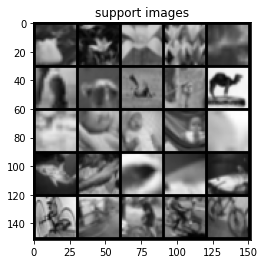

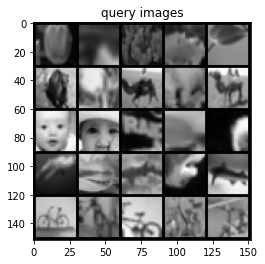

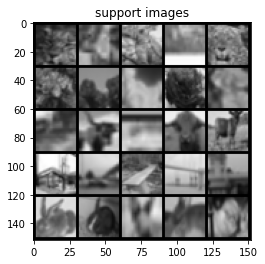

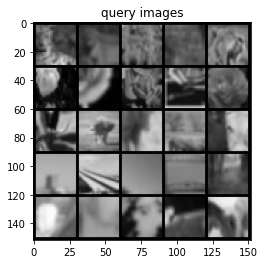

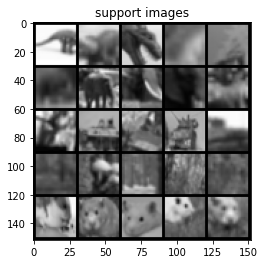

...

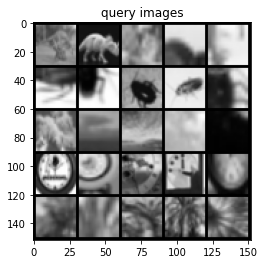

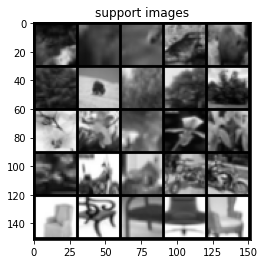

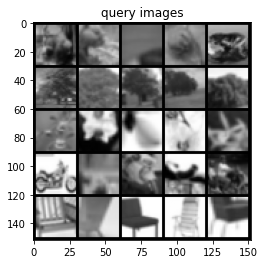

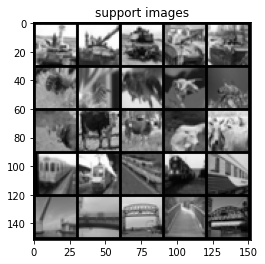

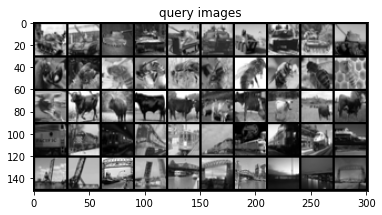

In [ ]:
print("\n The federated algorithms implemented are:\n 1) Fed-Averaging \n 2) Fed_Personalization \n 3) Fed_Proximal")
option=int(input("\nEnter the type of federated algorithm you want to run: "))
if option==1:
  tt= fed_avg()
if option==2:
  tt=fed_per()
if option==3:
  tt=fed_prox(global_model)




In [ ]:
"""
import matplotlib.pyplot as plt
rounds= range(1,num_rounds+1)
plt.plot(rounds, facc1, 'g', label='Client-1 accuracy')
plt.plot(rounds, facc2, 'b', label='Client-2 accuracy')
if num_selected==3:
 plt.plot(rounds, facc3, 'y', label='Client-3 accuracy')

plt.plot(rounds, ftacc, 'r', label='Server Testing accuracy')

plt.title('Clients Training and Server Testing Accuracies')
plt.xlabel('Rounds')
plt.ylabel('Accuracy')
plt.legend()
if num_selected==2:
    if option==1:
      plt.savefig(r"/content/gdrive/MyDrive/FFSML images/CIFAR-100/2/Fed_avg|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.png" % {"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds},dpi=200)
    if option==2:
      plt.savefig(r"/content/gdrive/MyDrive/FFSML images/CIFAR-100/2/Fed_per|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.png" % {"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds},dpi=200)
    if option==3:
      plt.savefig(r"/content/gdrive/MyDrive/FFSML images/CIFAR-100/2/Fed_prox|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.png" % {"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds},dpi=200)


if num_selected==3:
    if option==1:
      plt.savefig(r"/content/gdrive/MyDrive/FFSML images/CIFAR-100/3/Fed_avg|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.png" % {"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds},dpi=200)
    if option==2:
      plt.savefig(r"/content/gdrive/MyDrive/FFSML images/CIFAR-100/3/Fed_per|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.png" % {"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds},dpi=200)
    if option==3:
      plt.savefig(r"/content/gdrive/MyDrive/FFSML images/CIFAR-100/3/Fed_prox|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.png" % {"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds},dpi=200)

plt.show()


"""


'\nimport matplotlib.pyplot as plt\nrounds= range(1,num_rounds+1)\nplt.plot(rounds, facc1, \'g\', label=\'Client-1 accuracy\')\nplt.plot(rounds, facc2, \'b\', label=\'Client-2 accuracy\')\nif num_selected==3:\n plt.plot(rounds, facc3, \'y\', label=\'Client-3 accuracy\')\n\nplt.plot(rounds, ftacc, \'r\', label=\'Server Testing accuracy\')\n\nplt.title(\'Clients Training and Server Testing Accuracies\')\nplt.xlabel(\'Rounds\')\nplt.ylabel(\'Accuracy\')\nplt.legend()\nif num_selected==2:\n    if option==1:\n      plt.savefig(r"/content/gdrive/MyDrive/FFSML images/CIFAR-100/2/Fed_avg|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.png" % {"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds},dpi=200)\n    if option==2:\n      plt.savefig(r"/content/gdrive/MyDrive/FFSML images/CIFAR-100/2/Fed_per|%(n_way)d|%(n_shot)d|%(n_query)d|%(n_rounds)d.png" % {"n_way": SN_WAY, "n_shot":SN_SHOT,"n_query": SN_QUERY,"n_rounds":num_rounds},dpi=200)\n    if option==3:\n      plt.savefi

In [ ]:
def avg(lst):
    return sum(lst) / len(lst)
 
import math
# We relay on our previous implementation for the variance
def variance(data, ddof=0):
       n = len(data)
       mean = sum(data) / n
       return sum((x - mean) ** 2 for x in data) / (n - ddof)

def stdev(data):
    var = variance(data)
    std_dev = math.sqrt(var)
    return std_dev



In [ ]:
print("mu",mu)
print("\nSever Base Train:%d"%accu)
#print('\naverage train loss %0.3g |average train acc %0.3g | test loss %0.3g | test acc: %0.3f' % (floss / num_selected, faccuracy/num_selected,ftest_loss, facc))
print("\nAverage train loss for Client 1:", avg(floss1))
print("Average train accuracy: ", avg(facc1))
print("\nStandard Deviation: ",stdev(floss1))
print("\nVaraince: ",variance(floss1))


print("\nAverage train loss for Client 2:", avg(floss2) )
print("Average train accuracy: ", avg(facc2))
print("\nStandard Deviation: ",stdev(floss2))
print("\nVaraince: ",variance(floss2))

if num_selected==3:
  print("\nAverage train loss for Client 2:", avg(floss3) )
  print("Average train accuracy: ", avg(facc3)) 
  print("\nStandard Deviation: ",stdev(floss3))
  print("\nVaraince: ",variance(floss3))


print("\nAverage train loss for Server Testing:", avg(ftloss) )
print("Average train accuracy: ", avg(ftacc))
print("\nStandard Deviation: ",stdev(ftloss))
print("\nVaraince: ",variance(ftloss))








mu 1.5

Sever Base Train:27

Average train loss for Client 1: 1.6090821623802185
Average train accuracy:  29.6

Standard Deviation:  0.14716171396945954

Varaince:  0.021656570058429025

Average train loss for Client 2: 1.5901090443134307
Average train accuracy:  30.2

Standard Deviation:  0.10453940612780906

Varaince:  0.010928487433555002

Average train loss for Client 2: 1.598393851518631
Average train accuracy:  30.2

Standard Deviation:  0.16906220990855778

Varaince:  0.02858203081916525

Average train loss for Server Testing: 1.888526087999344
Average train accuracy:  34.0

Standard Deviation:  0.6470037937160068

Varaince:  0.4186139090829051


In [ ]:
with open('/content/gdrive/MyDrive/FFSML images/CIFAR-100/results.txt' , 'a') as f:
    

    f.write( '\nOption: %d,N-way: %d, N-shot: %d, N-query : %d, N-rounds: %d,Server base train: %s,Client 1: %s, Client 2: %s, Server: %s \n' %(option,SN_WAY,SN_SHOT,SN_QUERY,num_rounds,accu,facc1,facc2,ftacc)  )
    if num_selected==3:
      f.write( '\nOption: %d, N-way: %d, N-shot: %d, N-query : %d, N-rounds: %d,Server Base train: %s,Client 1: %s, Client 2: %s,Client 3: %s, Server: %s \n' %(option,SN_WAY,SN_SHOT,SN_QUERY,num_rounds,accu,facc1,facc2,facc3,ftacc)  )
    f.write('\n mu=%f'%mu)
    f.write("Average train loss for Client 1: %f"%avg(floss1))
    f.write("\nAverage train accuracy: %f" %avg(facc1))
    f.write("\nStandard Deviation: %f"%stdev(floss1))
    f.write("\nVaraince: %f"%variance(floss1))


    f.write("\nAverage train loss for Client 2: %f"%avg(floss2) )
    f.write("\nAverage train accuracy: %f" %avg(facc2))
    f.write("\nStandard Deviation: %f"%stdev(floss2))
    f.write("\nVaraince: %f"%variance(floss2))

    if num_selected==3:
      f.write("\nAverage train loss for Client 2: %f"%avg(floss3) )
      f.write("\nAverage train accuracy: %f" %avg(facc3)) 
      f.write("\nStandard Deviation: %f"%stdev(floss3))
      f.write("\nVaraince: %f"%variance(floss3))
    f.write("\nAverage train loss for Server Testing: %f" %avg(ftloss) )
    f.write("\nAverage train accuracy:%f"% avg(ftacc))
    f.write("\nStandard Deviation: %f"%stdev(ftloss))
    f.write("\nVaraince:%f "%variance(ftloss))

    f.write("\nTIME TAKEN:%f"%tt)
    f.write('\n****************************************************************************')